In [ ]:
! pip install yfinance
! pip install arch
! pip install statsmodels
! pip install hmmlearn
! pip install pgmpy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 982.9/982.9 kB 9.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 166.0/166.0 kB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 23.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 162.6/162.6 kB 8.3 MB/s eta 0:00:00


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display
import yfinance as yf
import warnings
warnings.filterwarnings("ignore")
pd.set_option('display.max_columns', None)

from numpy.linalg import eig
from sklearn.preprocessing import QuantileTransformer

import statsmodels.api as sm
from statsmodels.tsa.api import VAR
from statsmodels.tsa.arima.model import ARIMA
from arch.unitroot import ADF, KPSS
from arch import arch_model
from statsmodels.stats.diagnostic import acorr_ljungbox
from scipy.stats import norm, t
from hmmlearn.hmm import CategoricalHMM
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from arch.unitroot import ADF, KPSS
from hmmlearn.hmm import GaussianHMM
import networkx as nx
from pgmpy.estimators import (HillClimbSearch, BIC,BayesianEstimator,ExpertKnowledge,)
from pgmpy.models import DiscreteBayesianNetwork
from pgmpy.inference import VariableElimination
from pgmpy.estimators import (
    HillClimbSearch,
    PC,
    BIC,
    BDeu,
    BayesianEstimator
)
from pgmpy.models import DiscreteBayesianNetwork

# **Model One: Baseline Model**

In [ ]:
# clean raw data before transformation data from dec 1997 to march 2024
data_baseline = pd.read_csv('data_final.csv').set_index('Date')
data_baseline.index = pd.to_datetime(data_baseline.index)
data_baseline.tail()

,Temp_mean_anom,oecd_inds,russia_inds,us_inds,india_inds,china_inds,opec_product,nonopec_product,oecd_consump,nonoecd_consump,world_inv,geo_risk,IPG21112S,A24STI,CAPUTLG211S,vix,DX_Y_NYB,nasdaq,dgs10,cl_f
Date,,,,,,,,,,,,,,,,,,,,
2023-11-01,1.40,-0.768590,121.7,100.8639,125.6181,106.6,23.77,53.73,46.35,56.02,-1.51,153.827333,140.9522,47385.0,96.8914,12.92,103.500000,14226.219727,4.502857,77.685000
2023-12-01,1.35,0.066993,121.7,100.6031,125.6181,106.6,23.70,54.06,45.94,56.62,-1.32,139.566129,140.9450,46414.0,96.5743,12.45,101.330002,15011.349609,4.020000,71.900000
2024-01-01,1.25,-1.404846,121.7,99.2223,125.6181,106.6,23.54,52.83,44.55,55.19,-1.68,156.520323,134.2553,45223.0,91.9042,14.35,103.269997,15164.009766,4.058095,74.152381
2024-02-01,1.44,-1.340489,121.7,100.2850,125.6181,106.6,23.84,53.21,45.30,56.60,-0.76,144.128621,141.3976,45436.0,96.5519,13.40,104.160004,16091.919922,4.207500,77.249000
2024-03-01,1.39,-1.257171,121.7,100.4575,125.6181,106.6,24.18,53.30,44.92,56.40,-2.16,155.180000,140.2160,45612.0,95.2345,13.01,104.550003,16379.459961,4.208500,81.278000


In [ ]:
def regime_detection(train, df, n_states=3):

  ''' perfrom regime detection using categorical hmm model,
      input: data frame with categorical variables'''

  results = {
      'Variable': [],
      'LogLikelihood': [],
      'Converged': [],
      'StateCoverage': [],
      'NumSwitches': [],
      'StartProbability': [],
      'TransitionMatrix': [],
      'EmissionMatrix': []
  }

  df = df.astype(int)

  colours = ['#d73027', '#fee08b', '#1a9850']

  for col in df.columns:
      X = df[[col]].values
      model = CategoricalHMM(n_components=n_states,n_iter=1000, random_state=42)
      model.fit(X)
      states = model.predict(X)
      coverage = (pd.Series(states).value_counts(normalize=True).sort_index().round(3).to_dict())
      num_switches = np.sum(states[1:] != states[:-1])
      plot_data = train.loc[df.index, col]
      fig, ax = plt.subplots(figsize=(18,4))
      # Original series
      ax.plot(plot_data.index,plot_data,color='black',linewidth=1.5)
      # Fill regimes
      for regime in range(n_states):
          mask = states == regime
          ax.fill_between(plot_data.index,plot_data.min(),plot_data.max(),
              where=mask,color=colours[regime],alpha=0.25,label=f'Regime {regime}')
      ax.set_title(f'{col} - Hidden Markov Regimes')
      ax.set_xlabel('Time')
      ax.set_ylabel(col)
      ax.legend()
      plt.tight_layout()
      plt.show()


      # result
      results['Variable'].append(col)
      results['LogLikelihood'].append(model.score(X))
      results['Converged'].append(model.monitor_.converged)
      results['StateCoverage'].append(coverage)
      results['NumSwitches'].append(num_switches)
      results['StartProbability'].append(np.round(model.startprob_,3))
      results['TransitionMatrix'].append(np.round(model.transmat_,3))
      results['EmissionMatrix'].append(np.round(model.emissionprob_,3))


  return pd.DataFrame(results)

### **Discretizing the dataframe**

##### **Model 0: Binary Directional Discretization**

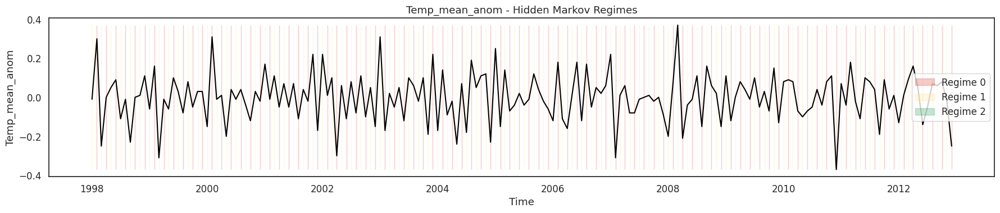

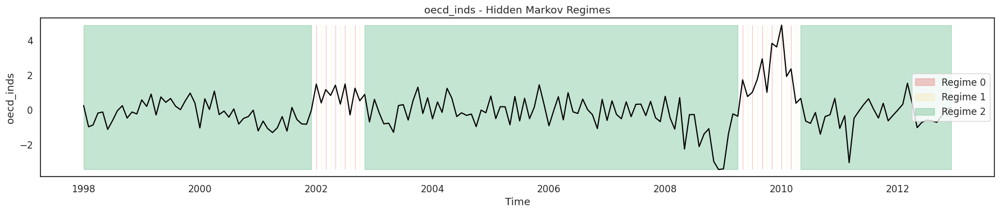

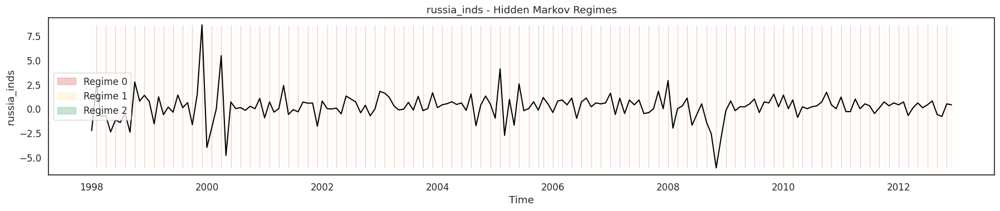

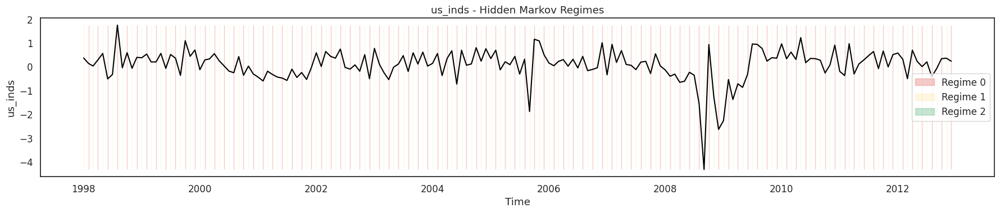

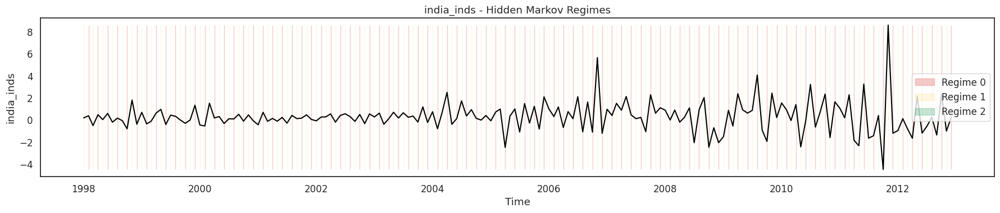

...

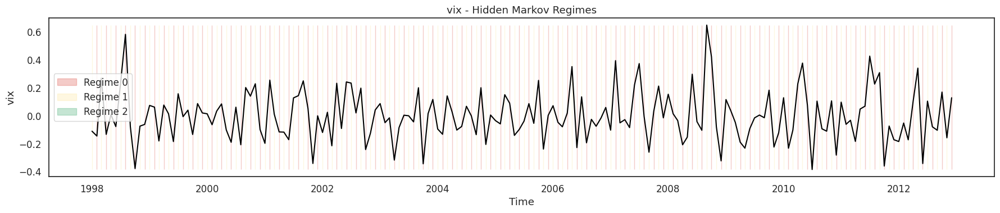

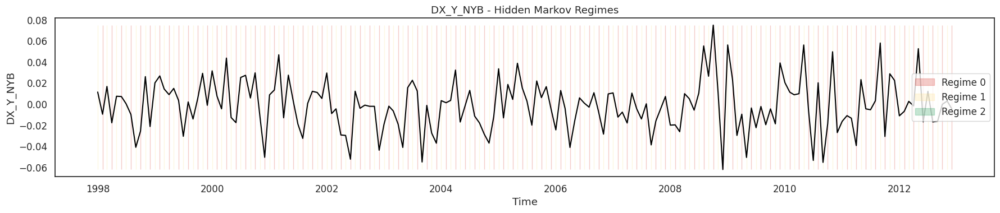

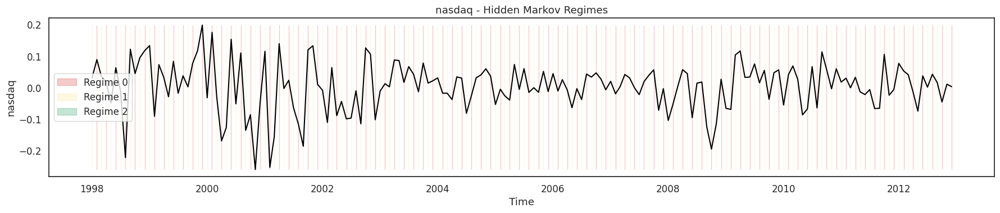

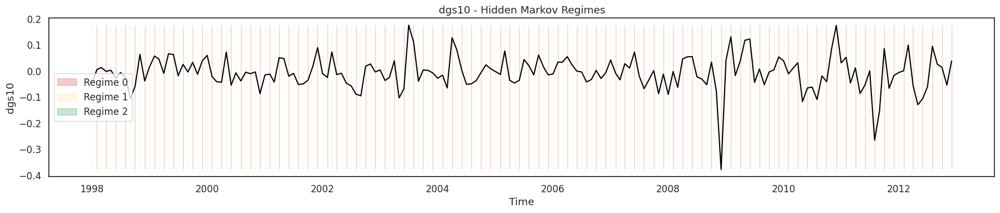

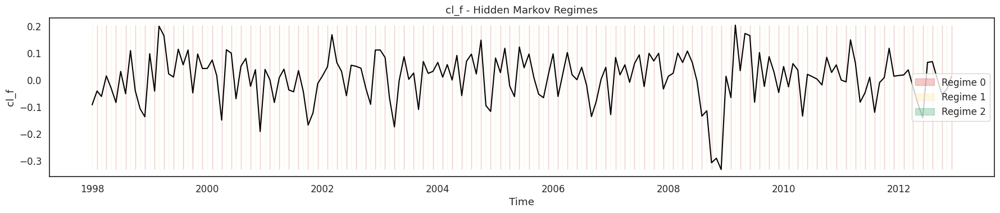

,LogLikelihood,Converged,StateCoverage,NumSwitches,StartProbability,TransitionMatrix,EmissionMatrix
Variable,,,,,,,
Temp_mean_anom,-1.076916e-14,True,"{0: 0.5, 1: 0.5}",179,"[0.114, 0.878, 0.008]","[[0.001, 0.999, 0.0], [0.955, 0.008, 0.037], [...","[[1.0], [1.0], [1.0]]"
oecd_inds,-4.691450e+01,True,"{0: 0.061, 1: 0.061, 2: 0.878}",24,"[0.0, 0.0, 1.0]","[[0.0, 0.997, 0.003], [0.775, 0.0, 0.225], [0....","[[0.108, 0.892], [0.75, 0.25], [0.968, 0.032]]"
russia_inds,-8.524909e+01,True,"{0: 0.494, 1: 0.5, 2: 0.006}",179,"[0.0, 0.999, 0.001]","[[0.001, 0.999, 0.0], [0.938, 0.009, 0.052], [...","[[0.762, 0.238], [0.867, 0.133], [0.833, 0.167]]"
us_inds,-2.601963e+01,True,"{0: 0.5, 1: 0.5}",179,"[0.0, 0.997, 0.002]","[[0.001, 0.999, 0.0], [0.937, 0.008, 0.055], [...","[[0.951, 0.049], [0.98, 0.02], [0.984, 0.016]]"
india_inds,-8.575633e+01,True,"{0: 0.5, 1: 0.5}",179,"[0.221, 0.755, 0.024]","[[0.001, 0.999, 0.0], [0.911, 0.017, 0.072], [...","[[0.815, 0.185], [0.815, 0.185], [0.837, 0.163]]"
china_inds,-8.268497e+01,True,"{0: 0.5, 1: 0.5}",179,"[0.321, 0.609, 0.07]","[[0.001, 0.999, 0.0], [0.931, 0.011, 0.058], [...","[[0.811, 0.189], [0.834, 0.166], [0.91, 0.09]]"
opec_product,-1.320332e+01,True,"{0: 0.5, 1: 0.5}",179,"[1.0, 0.0, 0.0]","[[0.0, 1.0, 0.0], [0.996, 0.0, 0.004], [0.097,...","[[0.966, 0.034], [1.0, 0.0], [1.0, 0.0]]"
nonopec_product,-6.189364e+00,True,"{0: 0.5, 1: 0.5}",179,"[0.083, 0.907, 0.011]","[[0.001, 0.999, 0.0], [0.925, 0.011, 0.064], [...","[[0.992, 0.008], [0.997, 0.003], [0.996, 0.004]]"
oecd_consump,-7.494181e+01,True,"{0: 0.5, 1: 0.5}",179,"[0.0, 1.0, 0.0]","[[0.0, 1.0, 0.0], [1.0, 0.0, 0.0], [0.006, 0.8...","[[0.644, 0.356], [0.956, 0.044], [0.875, 0.125]]"


In [ ]:
# define a 15 year training data to find the method for discritizing

discrete_baseline = data_baseline.loc[:'2012-12-30', : ]

financial = ['vix', 'DX_Y_NYB', 'nasdaq', 'dgs10', 'cl_f']
non_financial = ['Temp_mean_anom', 'oecd_inds', 'russia_inds', 'us_inds', 'india_inds', 'china_inds', 'opec_product', 'nonopec_product',
    'oecd_consump', 'nonoecd_consump', 'world_inv','geo_risk', 'IPG21112S', 'A24STI', 'CAPUTLG211S']
# Log returns
discrete_baseline[financial] = np.log(discrete_baseline[financial] / discrete_baseline[financial].shift(1))
# First differences
discrete_baseline[non_financial] = discrete_baseline[non_financial].diff()
discrete_baseline = discrete_baseline.dropna()

# model zero
discrete_zero = discrete_baseline.copy()
discrete_zero = (discrete_zero > 1).astype(int)

train_zero = discrete_baseline.loc[discrete_zero.index[0]: discrete_zero.index[-1], :]
result_zero = regime_detection(train_zero, discrete_zero, 3)
result_zero.set_index('Variable')

Number of regime switches of 17 variables = 179 , every observation , regime change


#### **Model 1: Directional Discretization by Threshold**

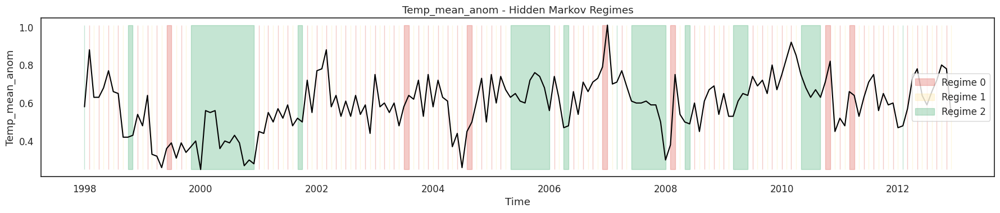

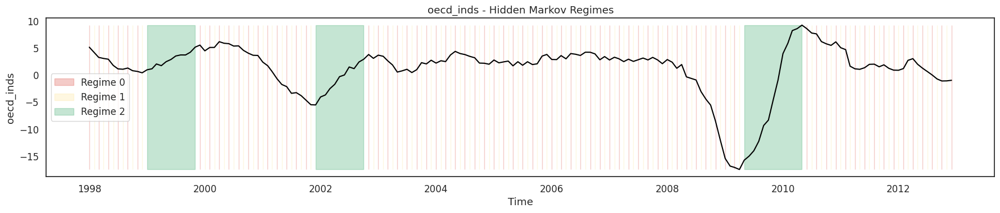

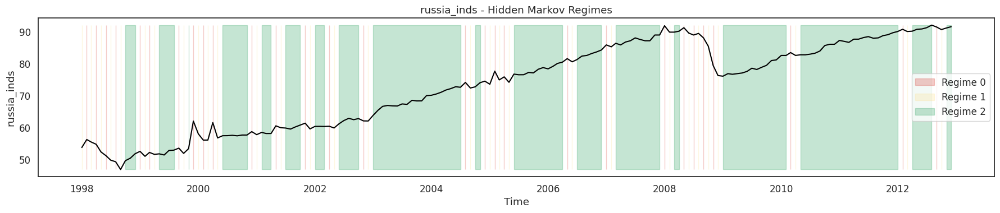

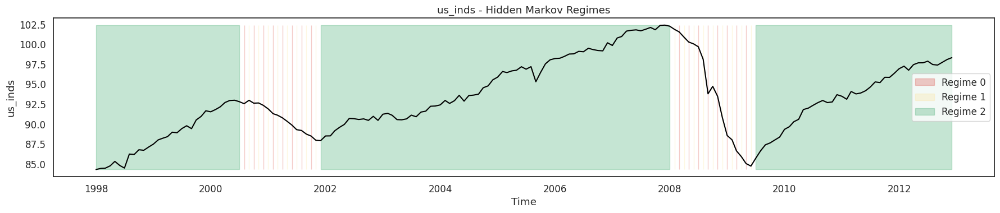

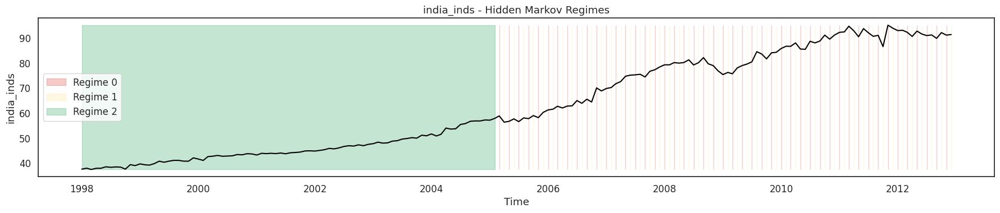

...

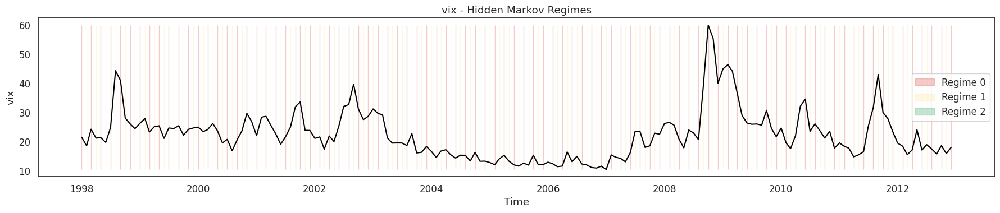

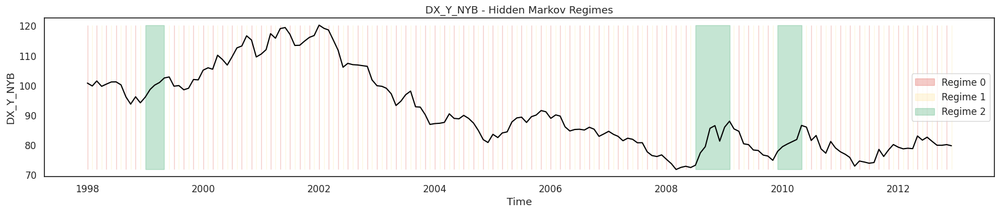

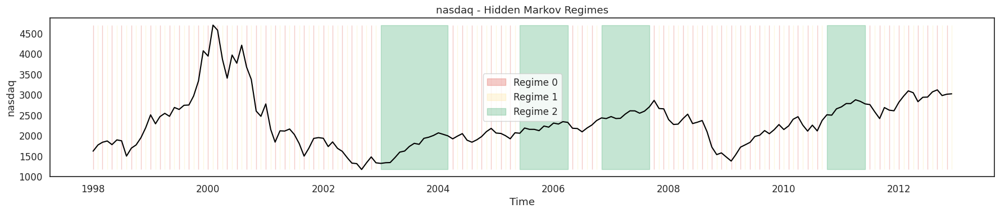

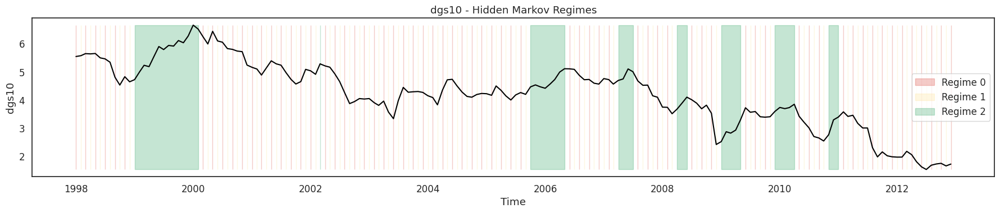

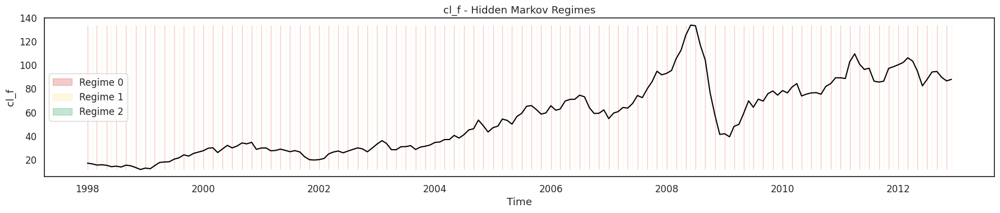

,LogLikelihood,Converged,StateCoverage,NumSwitches,StartProbability,TransitionMatrix,EmissionMatrix
Variable,,,,,,,
Temp_mean_anom,-177.606620,True,"{0: 0.378, 1: 0.339, 2: 0.283}",133,"[0.0, 0.0, 1.0]","[[0.124, 0.876, 0.0], [0.809, 0.017, 0.174], [...","[[0.039, 0.239, 0.722], [0.747, 0.113, 0.14], ..."
oecd_inds,-185.491339,True,"{0: 0.406, 1: 0.4, 2: 0.194}",147,"[1.0, 0.0, 0.0]","[[0.002, 0.998, 0.0], [0.92, 0.008, 0.072], [0...","[[0.372, 0.473, 0.155], [0.541, 0.276, 0.183],..."
russia_inds,-179.029594,True,"{0: 0.161, 1: 0.167, 2: 0.672}",76,"[0.0, 1.0, 0.0]","[[0.008, 0.992, 0.0], [0.485, 0.0, 0.515], [0....","[[0.2, 0.107, 0.693], [0.629, 0.346, 0.025], [..."
us_inds,-173.190237,True,"{0: 0.089, 1: 0.094, 2: 0.817}",35,"[0.0, 0.0, 1.0]","[[0.0, 1.0, 0.0], [0.851, 0.002, 0.147], [0.00...","[[0.914, 0.085, 0.0], [0.78, 0.126, 0.094], [0..."
india_inds,-166.374699,True,"{0: 0.261, 1: 0.261, 2: 0.478}",94,"[0.0, 0.0, 1.0]","[[0.003, 0.997, 0.0], [0.986, 0.014, 0.0], [0....","[[0.354, 0.111, 0.535], [0.323, 0.294, 0.383],..."
china_inds,-150.766933,True,"{0: 0.328, 1: 0.328, 2: 0.344}",125,"[0.0, 0.0, 1.0]","[[0.0, 0.999, 0.001], [0.842, 0.0, 0.158], [0....","[[0.196, 0.654, 0.15], [0.339, 0.341, 0.32], [..."
opec_product,-182.650435,True,"{0: 0.4, 1: 0.4, 2: 0.2}",148,"[1.0, 0.0, 0.0]","[[0.0, 1.0, 0.0], [0.899, 0.0, 0.101], [0.153,...","[[0.195, 0.447, 0.358], [0.475, 0.099, 0.426],..."
nonopec_product,-194.918420,True,"{0: 0.467, 1: 0.467, 2: 0.067}",179,"[0.0, 0.0, 1.0]","[[0.004, 0.996, 0.0], [0.773, 0.037, 0.19], [0...","[[0.447, 0.257, 0.296], [0.268, 0.391, 0.341],..."
oecd_consump,-186.003445,True,"{0: 0.5, 1: 0.5}",179,"[0.0, 1.0, 0.0]","[[0.0, 1.0, 0.0], [1.0, 0.0, 0.0], [0.027, 0.5...","[[0.245, 0.222, 0.533], [0.456, 0.333, 0.211],..."


In [ ]:
# ----- Compute variable-specific thresholds -----
thresholds = 0.35 * discrete_baseline.std()
# ----- Discretize -----
discrete_one = discrete_baseline.copy()
for col in discrete_one.columns:
    th = thresholds[col]
    discrete_one[col] = np.where(discrete_one[col] > th, 2, np.where(discrete_one[col] < -th, 0, 1))

train_one = data_baseline.loc[discrete_one.index[0]: discrete_one.index[-1], :]
result_one = regime_detection(train_one, discrete_one, 3)
result_one.set_index('Variable')

5 variable, 179 regime changes

#### **Model 2: Directional Discretization by Rolling mean & Threshold**

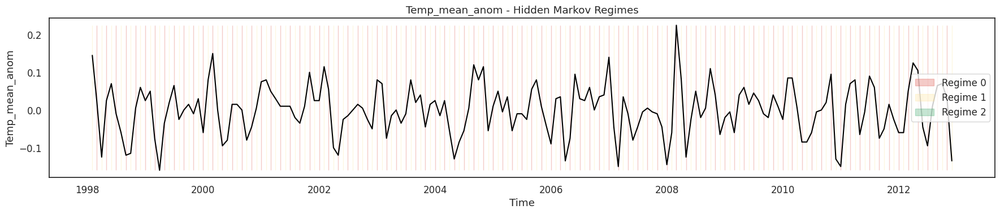

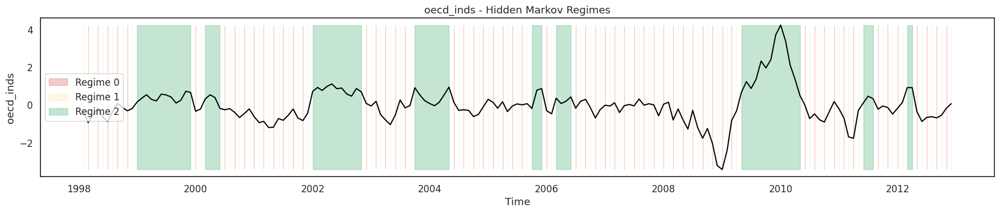

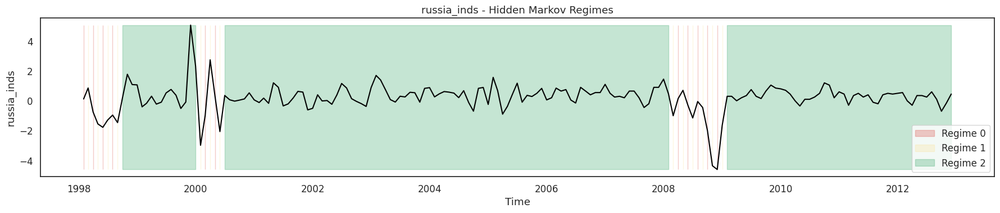

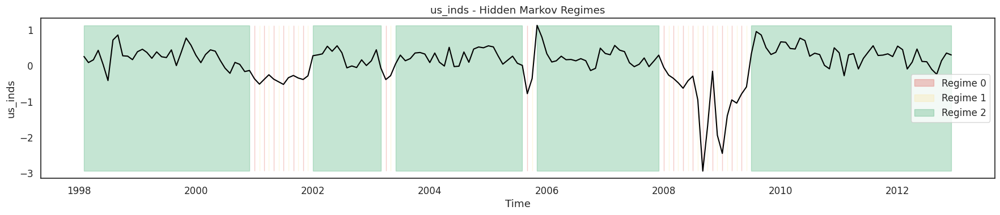

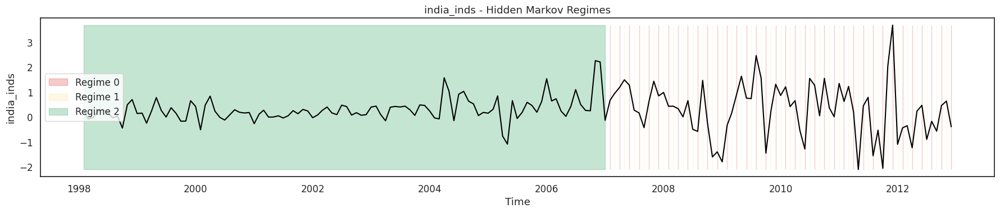

...

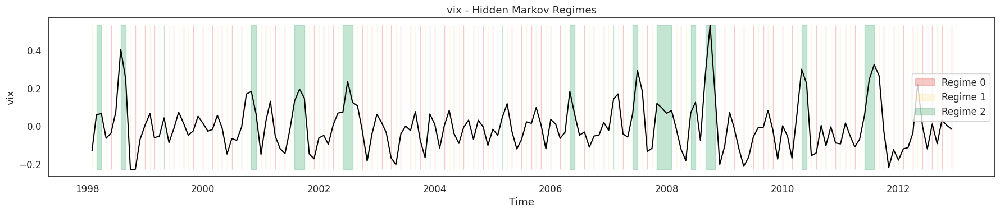

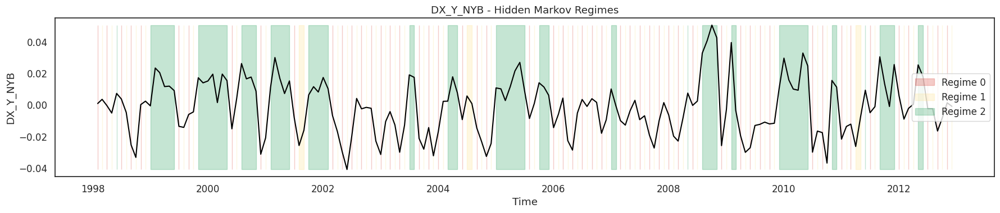

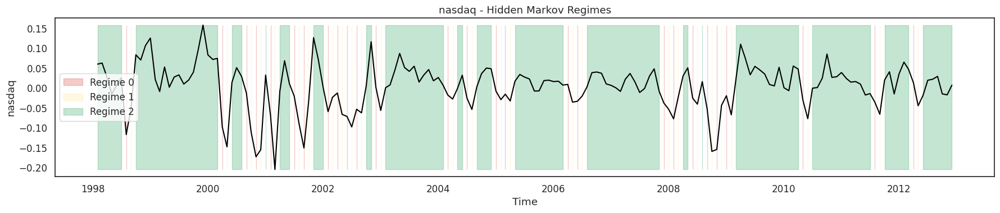

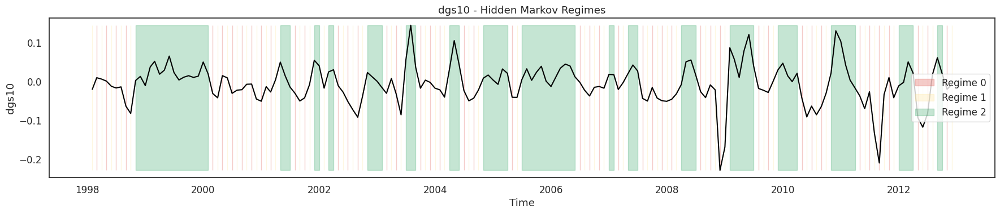

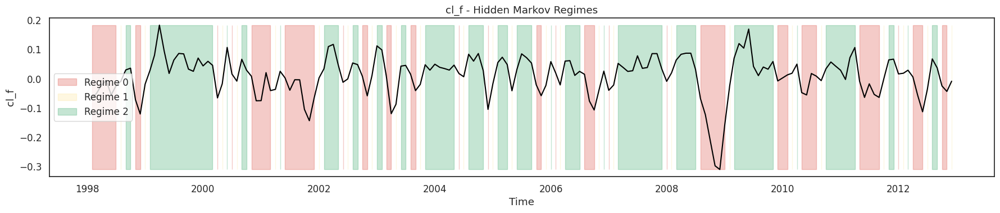

,LogLikelihood,Converged,StateCoverage,NumSwitches,StartProbability,TransitionMatrix,EmissionMatrix
Variable,,,,,,,
Temp_mean_anom,-195.906164,True,"{0: 0.497, 1: 0.503}",178,"[0.0, 0.993, 0.006]","[[0.002, 0.998, 0.0], [0.916, 0.014, 0.071], [...","[[0.335, 0.306, 0.359], [0.358, 0.27, 0.371], ..."
oecd_inds,-160.457660,True,"{0: 0.33, 1: 0.335, 2: 0.335}",127,"[0.002, 0.998, 0.0]","[[0.003, 0.997, 0.0], [0.793, 0.028, 0.18], [0...","[[0.511, 0.489, 0.0], [0.548, 0.452, 0.0], [0...."
russia_inds,-169.407736,True,"{0: 0.061, 1: 0.073, 2: 0.866}",26,"[1.0, 0.0, 0.0]","[[0.0, 1.0, 0.0], [0.63, 0.0, 0.37], [0.0, 0.0...","[[0.578, 0.421, 0.0], [0.703, 0.0, 0.297], [0...."
us_inds,-144.759248,True,"{0: 0.095, 1: 0.095, 2: 0.81}",38,"[0.0, 0.0, 1.0]","[[0.0, 1.0, 0.0], [0.762, 0.002, 0.236], [0.02...","[[0.884, 0.116, 0.0], [1.0, 0.0, 0.0], [0.03, ..."
india_inds,-160.209346,True,"{0: 0.201, 1: 0.196, 2: 0.603}",71,"[0.0, 0.0, 1.0]","[[0.001, 0.999, 0.0], [0.991, 0.009, 0.0], [0....","[[0.296, 0.152, 0.552], [0.298, 0.151, 0.551],..."
china_inds,-175.647413,True,"{0: 0.279, 1: 0.307, 2: 0.413}",117,"[0.0, 0.0, 1.0]","[[0.0, 1.0, 0.0], [0.726, 0.001, 0.273], [0.12...","[[0.426, 0.259, 0.315], [0.512, 0.011, 0.476],..."
opec_product,-181.924069,True,"{0: 0.352, 1: 0.346, 2: 0.302}",138,"[1.0, 0.0, 0.0]","[[0.001, 0.999, 0.0], [0.769, 0.006, 0.225], [...","[[0.398, 0.144, 0.458], [0.4, 0.139, 0.462], [..."
nonopec_product,-174.866939,True,"{0: 0.19, 1: 0.458, 2: 0.352}",102,"[0.0, 0.0, 1.0]","[[0.0, 1.0, 0.0], [0.011, 0.59, 0.4], [0.564, ...","[[0.071, 0.412, 0.516], [0.7, 0.299, 0.001], [..."
oecd_consump,-194.364590,True,"{0: 0.503, 1: 0.497}",178,"[0.991, 0.009, 0.0]","[[0.002, 0.998, 0.0], [0.859, 0.02, 0.122], [0...","[[0.343, 0.272, 0.385], [0.345, 0.253, 0.402],..."


In [ ]:
# model two
# Smooth
model_two = discrete_baseline.copy()
model_two = model_two.rolling(window=2).mean().dropna()
# Variable-specific thresholds
thresholds = 0.35 * model_two.std()
# Discretize
discrete_two = model_two.copy()
for col in model_two.columns:
    th = thresholds[col]
    discrete_two[col] = np.where(model_two[col] > th, 2,np.where(model_two[col] < -th, 0, 1))

train_two = model_two.loc[discrete_two.index[0]: discrete_two.index[-1], :]

result_two = regime_detection(train_two, discrete_two, 3)
result_two.set_index('Variable')

3 variable, 178 regime changes

#### **Model 3: Directional Discretization by EWM & Threshold**

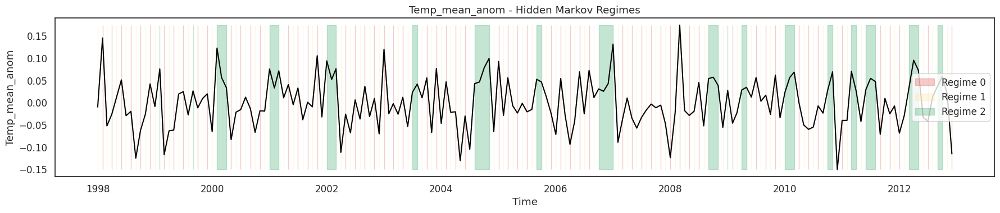

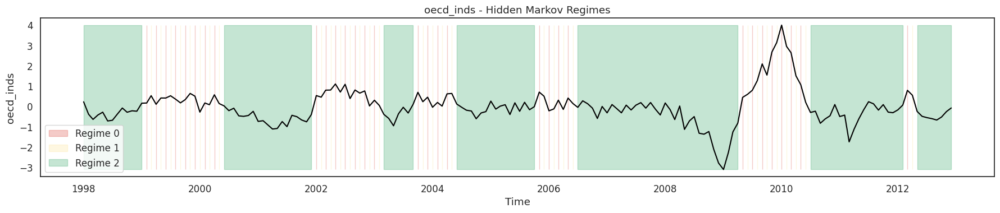

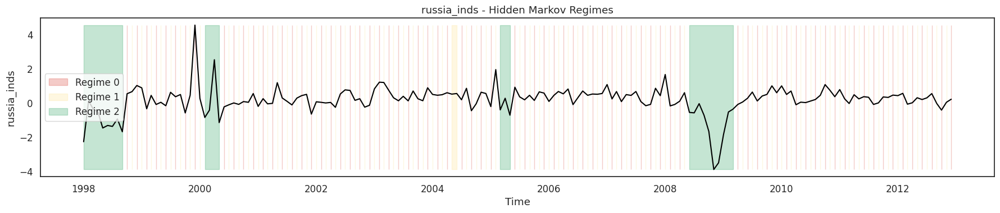

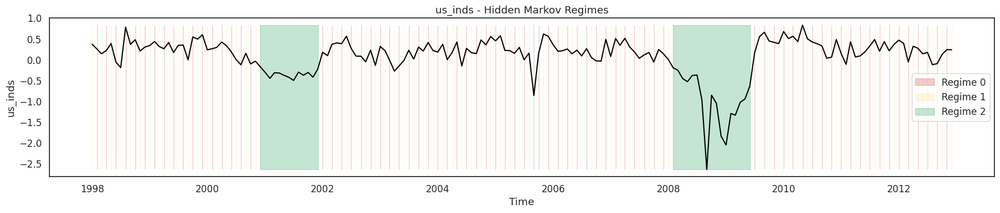

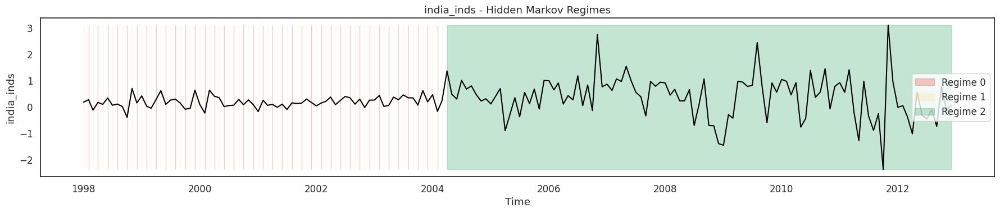

...

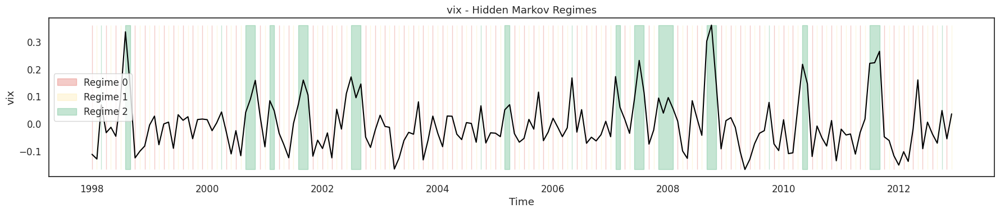

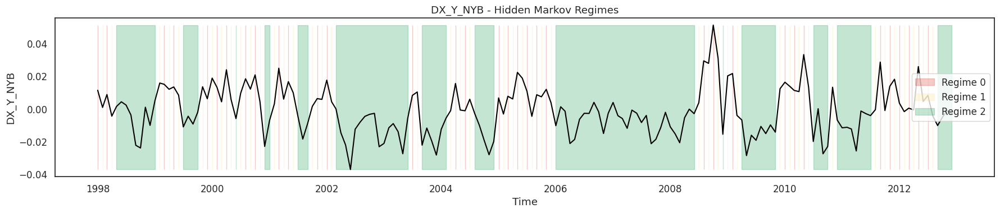

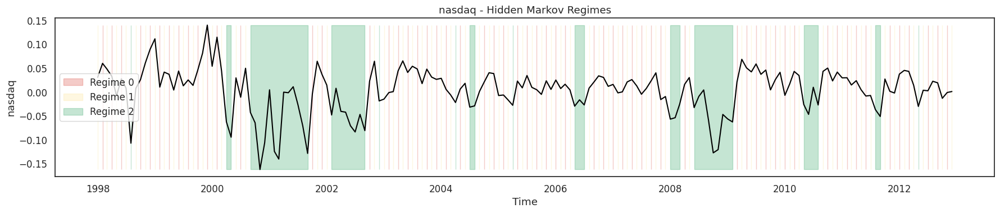

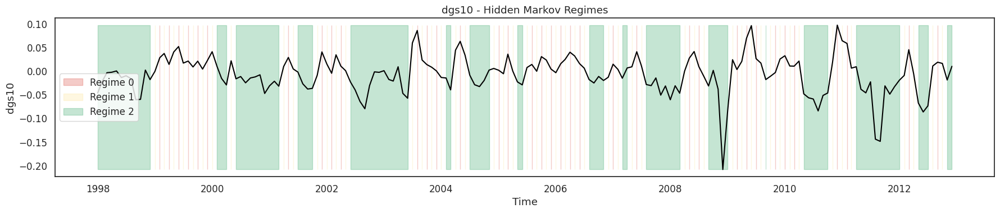

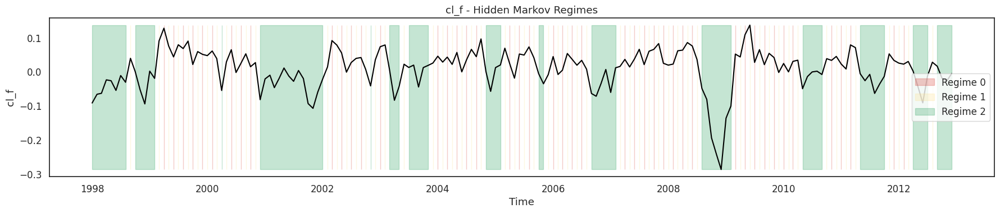

,LogLikelihood,Converged,StateCoverage,NumSwitches,StartProbability,TransitionMatrix,EmissionMatrix
Variable,,,,,,,
Temp_mean_anom,-186.352369,True,"{0: 0.344, 1: 0.411, 2: 0.244}",153,"[0.0, 1.0, 0.0]","[[0.0, 0.998, 0.001], [0.624, 0.001, 0.375], [...","[[0.28, 0.461, 0.259], [0.374, 0.598, 0.028], ..."
oecd_inds,-151.451499,True,"{0: 0.172, 1: 0.172, 2: 0.656}",68,"[0.0, 0.0, 1.0]","[[0.0, 1.0, 0.0], [0.817, 0.0, 0.183], [0.051,...","[[0.287, 0.0, 0.713], [0.455, 0.0, 0.545], [0...."
russia_inds,-156.990248,True,"{0: 0.428, 1: 0.428, 2: 0.144}",156,"[0.0, 0.0, 1.0]","[[0.002, 0.998, 0.0], [0.932, 0.031, 0.037], [...","[[0.449, 0.079, 0.472], [0.377, 0.0, 0.623], [..."
us_inds,-123.221473,True,"{0: 0.411, 1: 0.417, 2: 0.172}",151,"[0.0, 1.0, 0.0]","[[0.002, 0.998, 0.0], [0.956, 0.016, 0.028], [...","[[0.275, 0.0, 0.725], [0.364, 0.038, 0.598], [..."
india_inds,-156.217651,True,"{0: 0.206, 1: 0.211, 2: 0.583}",75,"[0.0, 1.0, 0.0]","[[0.0, 1.0, 0.0], [0.974, 0.0, 0.026], [0.0, 0...","[[0.511, 0.053, 0.436], [0.556, 0.0, 0.444], [..."
china_inds,-171.786028,True,"{0: 0.356, 1: 0.417, 2: 0.228}",150,"[1.0, 0.0, 0.0]","[[0.0, 1.0, 0.0], [0.828, 0.0, 0.172], [0.002,...","[[0.69, 0.269, 0.041], [0.694, 0.21, 0.097], [..."
opec_product,-181.651445,True,"{0: 0.339, 1: 0.372, 2: 0.289}",140,"[0.0, 1.0, 0.0]","[[0.0, 1.0, 0.0], [0.742, 0.0, 0.258], [0.158,...","[[0.338, 0.111, 0.551], [0.54, 0.0, 0.46], [0...."
nonopec_product,-181.211989,True,"{0: 0.139, 1: 0.506, 2: 0.356}",75,"[0.0, 0.0, 1.0]","[[0.198, 0.802, 0.0], [0.013, 0.715, 0.272], [...","[[0.856, 0.13, 0.014], [0.351, 0.52, 0.129], [..."
oecd_consump,-186.599062,True,"{0: 0.489, 1: 0.483, 2: 0.028}",175,"[0.0, 0.0, 1.0]","[[0.0, 1.0, 0.0], [1.0, 0.0, 0.0], [0.213, 0.0...","[[0.284, 0.217, 0.499], [0.356, 0.415, 0.229],..."


In [ ]:
# model three
model_three = discrete_baseline.copy()
# Smooth
model_three = model_three.ewm(span=3, adjust=False).mean().dropna()
# Variable-specific thresholds
thresholds = 0.35 * model_three.std()
# Discretize
discrete_three = model_three.copy()
for col in model_three.columns:
    th = thresholds[col]
    discrete_three[col] = np.where(model_three[col] > th, 2,np.where(model_three[col] < -th, 1, 0))

train_three = model_three.loc[discrete_three.index[0]: discrete_three.index[-1], :]

result_three = regime_detection(train_three, discrete_three, 3)
result_three.set_index('Variable')

#### **Model 4: Discretization by KMEANs**

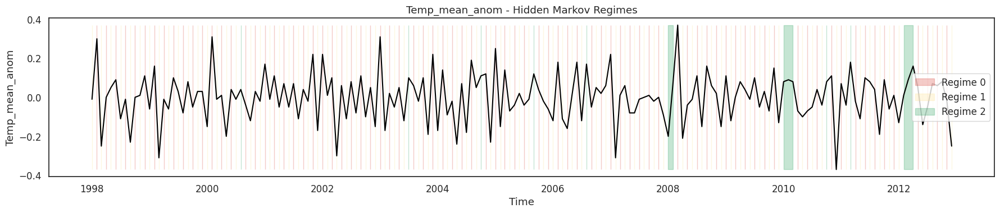

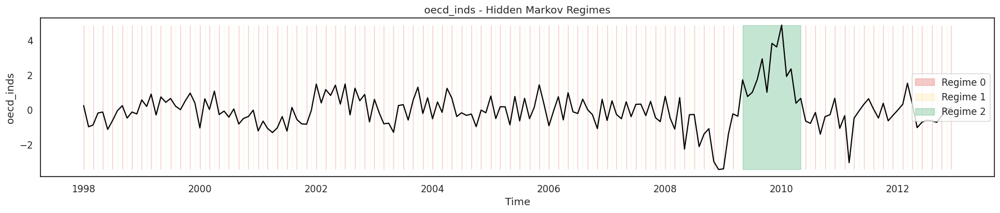

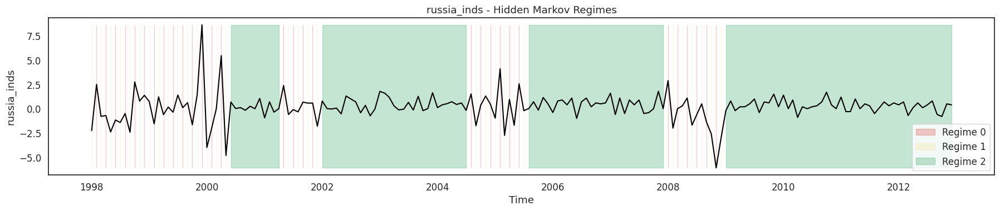

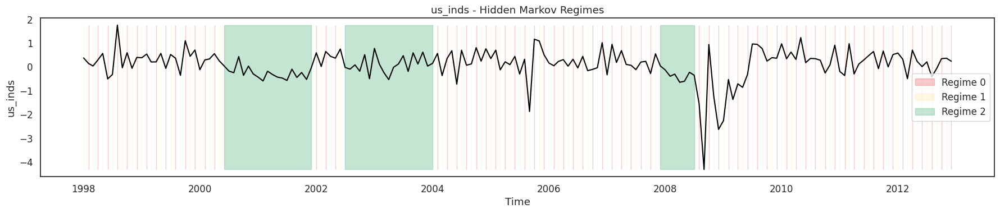

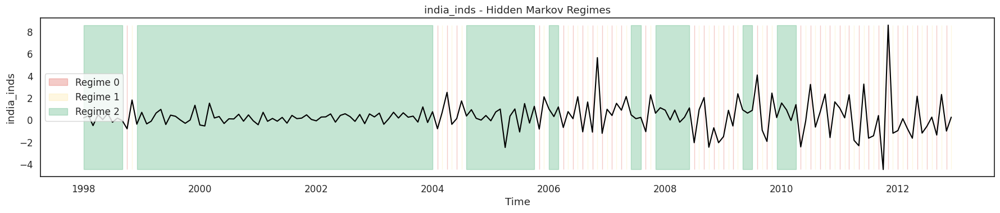

...

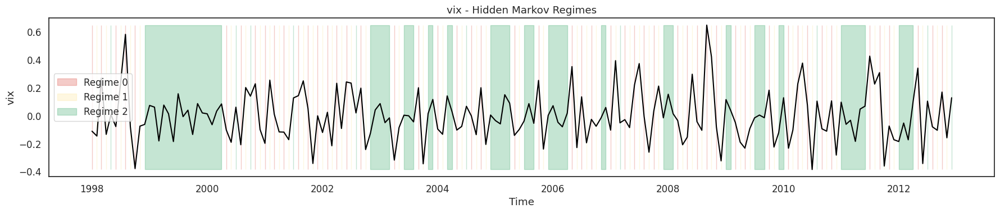

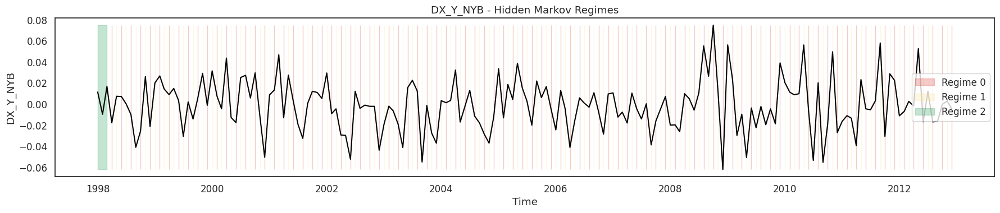

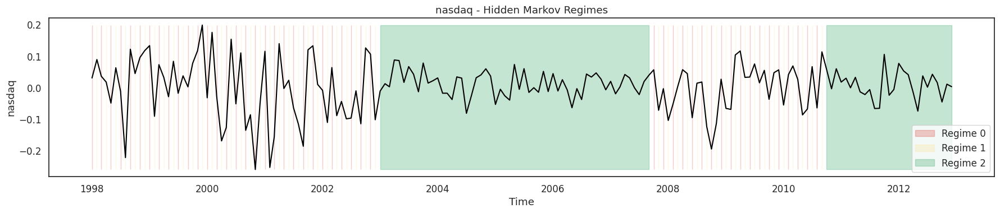

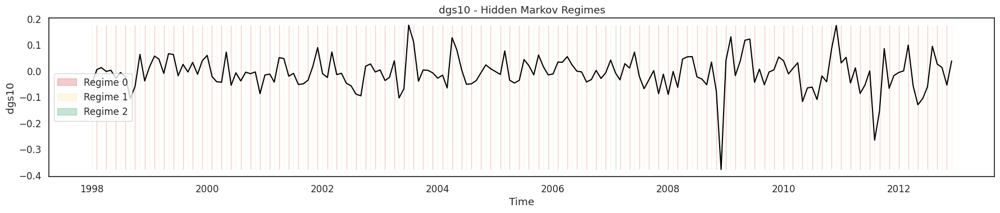

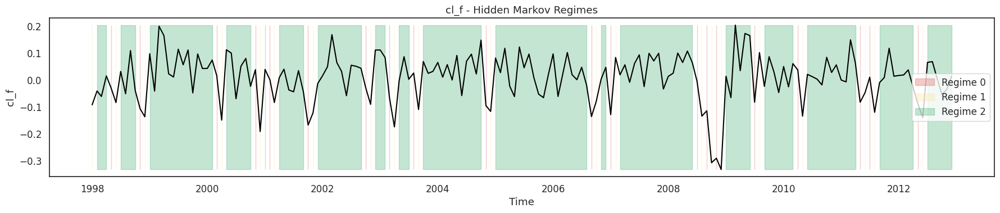

,LogLikelihood,Converged,StateCoverage,NumSwitches,StartProbability,TransitionMatrix,EmissionMatrix
Variable,,,,,,,
Temp_mean_anom,-172.739404,True,"{0: 0.456, 1: 0.461, 2: 0.083}",174,"[0.0, 1.0, 0.0]","[[0.008, 0.992, 0.0], [0.806, 0.001, 0.194], [...","[[0.014, 0.567, 0.42], [0.462, 0.491, 0.047], ..."
oecd_inds,-130.715067,True,"{0: 0.467, 1: 0.461, 2: 0.072}",167,"[0.998, 0.002, 0.0]","[[0.003, 0.997, 0.0], [0.959, 0.028, 0.014], [...","[[0.544, 0.456, 0.0], [0.541, 0.459, 0.0], [0...."
russia_inds,-74.329329,True,"{0: 0.167, 1: 0.172, 2: 0.661}",64,"[0.0, 1.0, 0.0]","[[0.0, 1.0, 0.0], [0.845, 0.0, 0.155], [0.031,...","[[0.196, 0.551, 0.253], [0.424, 0.576, 0.0], [..."
us_inds,-142.936661,True,"{0: 0.372, 1: 0.372, 2: 0.256}",136,"[0.0, 1.0, 0.0]","[[0.0, 1.0, 0.0], [0.928, 0.0, 0.072], [0.104,...","[[0.032, 0.266, 0.702], [0.072, 0.432, 0.495],..."
india_inds,-130.807448,True,"{0: 0.2, 1: 0.2, 2: 0.6}",79,"[0.0, 0.0, 1.0]","[[0.003, 0.997, 0.0], [0.765, 0.016, 0.219], [...","[[0.555, 0.26, 0.186], [0.275, 0.38, 0.346], [..."
china_inds,-49.656960,True,"{0: 0.061, 1: 0.033, 2: 0.906}",26,"[0.0, 0.0, 1.0]","[[0.0, 0.274, 0.726], [0.835, 0.0, 0.165], [0....","[[0.0, 0.003, 0.997], [0.998, 0.002, 0.0], [0...."
opec_product,-157.134730,True,"{0: 0.394, 1: 0.422, 2: 0.183}",145,"[1.0, 0.0, 0.0]","[[0.022, 0.978, 0.0], [0.908, 0.046, 0.046], [...","[[0.066, 0.7, 0.233], [0.318, 0.401, 0.281], [..."
nonopec_product,-179.441479,True,"{0: 0.217, 1: 0.211, 2: 0.572}",112,"[0.0, 0.0, 1.0]","[[0.301, 0.699, 0.0], [0.057, 0.001, 0.942], [...","[[0.113, 0.636, 0.251], [0.978, 0.003, 0.018],..."
oecd_consump,-165.278374,True,"{0: 0.5, 1: 0.5}",179,"[0.0, 1.0, 0.0]","[[0.0, 1.0, 0.0], [0.998, 0.0, 0.002], [0.005,...","[[0.212, 0.443, 0.345], [0.445, 0.533, 0.022],..."


In [ ]:
model_four = discrete_baseline.copy()
from sklearn.cluster import KMeans
discrete_four = pd.DataFrame(index=model_four.index)

for col in model_four.columns:
    X = model_four[[col]].values
    km = KMeans(n_clusters=3,random_state=42,n_init=20)
    labels = km.fit_predict(X)
    # Order clusters by their centers
    centers = km.cluster_centers_.flatten()
    order = np.argsort(centers)
    mapping = {order[0]: 0,order[1]: 1, order[2]: 2}
    discrete_four[col] = pd.Series(labels).map(mapping).values

train_four = model_four.loc[discrete_four.index[0]: discrete_four.index[-1], :]

result_four = regime_detection(train_four, discrete_four, 3)
result_four.set_index('Variable')

2 variables 179 regime changes

#### **Model 5: Discretization by Gaussian Mixture**

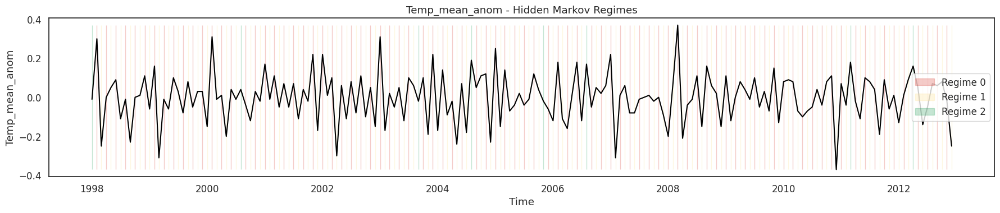

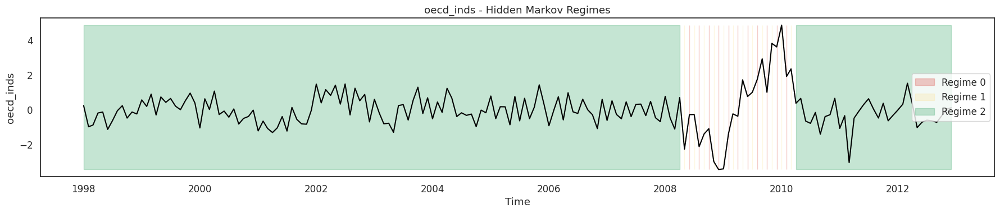

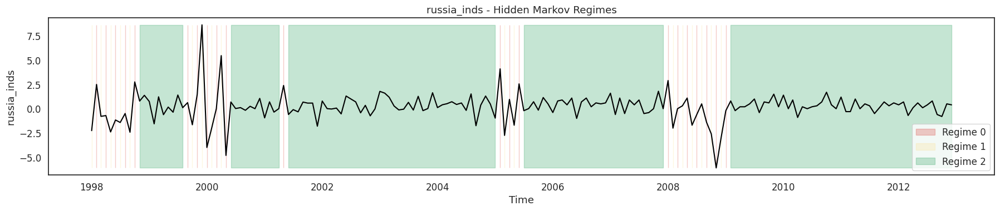

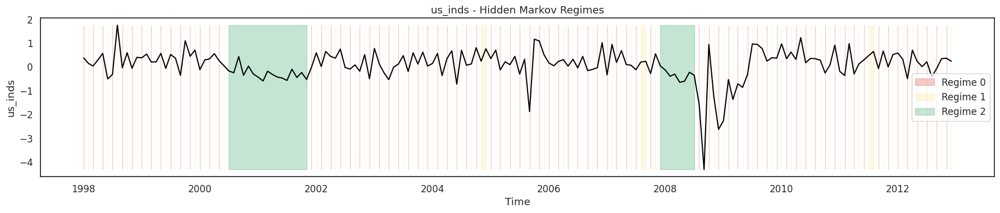

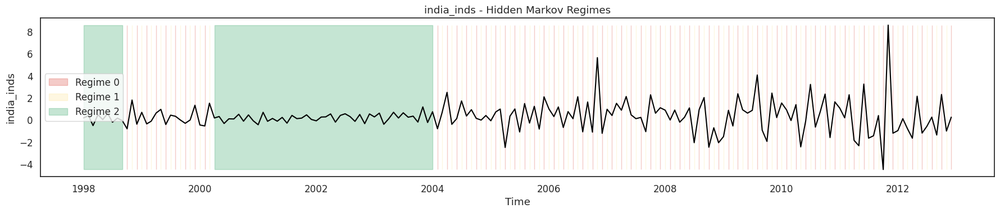

...

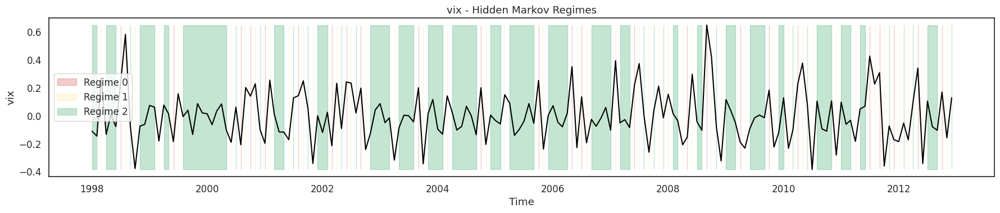

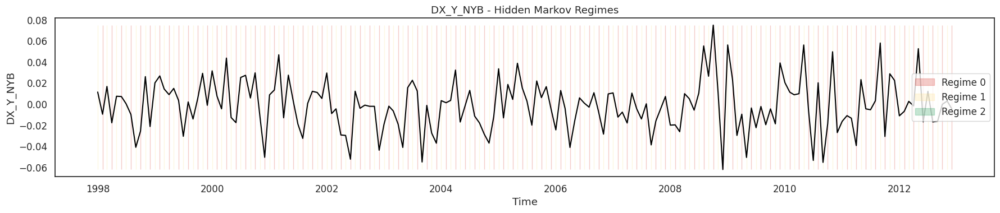

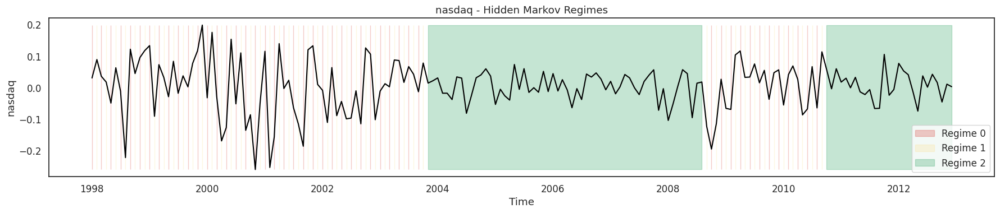

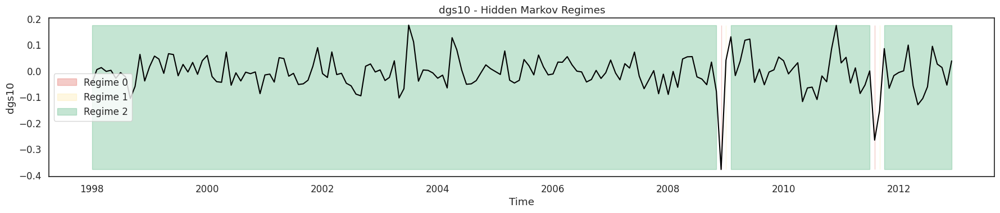

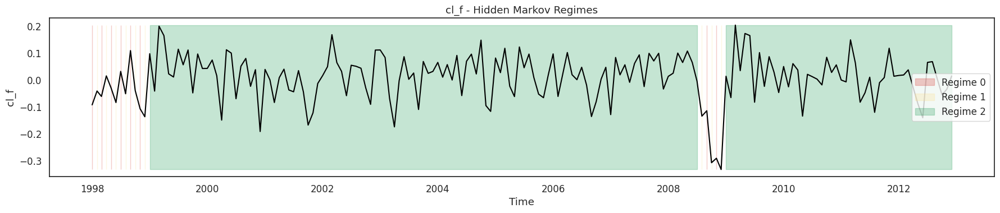

,LogLikelihood,Converged,StateCoverage,NumSwitches,StartProbability,TransitionMatrix,EmissionMatrix
Variable,,,,,,,
Temp_mean_anom,-138.781660,True,"{0: 0.478, 1: 0.478, 2: 0.044}",179,"[0.0, 0.0, 1.0]","[[0.003, 0.997, 0.0], [0.892, 0.001, 0.107], [...","[[0.071, 0.777, 0.151], [0.552, 0.448, 0.0], [..."
oecd_inds,-61.949877,True,"{0: 0.061, 1: 0.067, 2: 0.872}",24,"[0.0, 0.0, 1.0]","[[0.0, 1.0, 0.0], [0.865, 0.0, 0.135], [0.001,...","[[0.081, 0.61, 0.309], [0.14, 0.361, 0.499], [..."
russia_inds,-75.297062,True,"{0: 0.117, 1: 0.094, 2: 0.789}",42,"[0.0, 1.0, 0.0]","[[0.0, 0.748, 0.252], [0.999, 0.0, 0.001], [0....","[[0.096, 0.538, 0.366], [0.653, 0.237, 0.11], ..."
us_inds,-144.035729,True,"{0: 0.422, 1: 0.439, 2: 0.139}",153,"[1.0, 0.0, 0.0]","[[0.003, 0.996, 0.001], [0.837, 0.106, 0.057],...","[[0.041, 0.48, 0.479], [0.067, 0.211, 0.722], ..."
india_inds,-112.925492,True,"{0: 0.35, 1: 0.344, 2: 0.306}",126,"[0.0, 0.0, 1.0]","[[0.0, 1.0, 0.0], [0.971, 0.0, 0.029], [0.034,...","[[0.619, 0.381, 0.0], [0.697, 0.271, 0.032], [..."
china_inds,-74.434874,True,"{0: 0.061, 1: 0.044, 2: 0.894}",24,"[0.0, 0.0, 1.0]","[[0.057, 0.332, 0.611], [0.798, 0.0, 0.202], [...","[[0.069, 0.001, 0.931], [0.599, 0.401, 0.0], [..."
opec_product,-152.557756,True,"{0: 0.367, 1: 0.394, 2: 0.239}",139,"[1.0, 0.0, 0.0]","[[0.019, 0.981, 0.0], [0.868, 0.07, 0.062], [0...","[[0.041, 0.746, 0.214], [0.304, 0.4, 0.296], [..."
nonopec_product,-172.206953,True,"{0: 0.5, 1: 0.5}",179,"[0.045, 0.904, 0.051]","[[0.002, 0.998, 0.0], [0.882, 0.012, 0.106], [...","[[0.13, 0.557, 0.313], [0.138, 0.524, 0.338], ..."
oecd_consump,-161.526268,True,"{0: 0.5, 1: 0.5}",179,"[0.0, 1.0, 0.0]","[[0.0, 1.0, 0.0], [0.999, 0.0, 0.001], [0.012,...","[[0.222, 0.466, 0.311], [0.445, 0.544, 0.011],..."


In [ ]:
from sklearn.mixture import GaussianMixture

# model Five
model_five = discrete_baseline.copy()
# Gaussian Mixture Discretization
discrete_five = pd.DataFrame(index=model_five.index)
for col in model_five.columns:
    X = model_five[[col]].values
    gmm = GaussianMixture(n_components=3,covariance_type='full',random_state=42,n_init=10)
    labels = gmm.fit_predict(X)
    # Order clusters by their means
    means = gmm.means_.flatten()
    order = np.argsort(means)
    mapping = {order[0]: 0,order[1]: 1, order[2]: 2}
    discrete_five[col] = pd.Series(labels).map(mapping).values
train_five = model_five.loc[discrete_five.index[0]:discrete_five.index[-1],:]
result_five = regime_detection(train_five,discrete_five,3)
result_five.set_index("Variable")

5 variables , 179 regime changes

### **Baseline Model**

In [ ]:
def pre_processing(df):
  ''' pre-processing the data frame :
      1- calculate log return and first difference
      2 - smooth data '''


  financial = ['vix','DX_Y_NYB','nasdaq','dgs10','cl_f']
  non_financial = ['Temp_mean_anom','oecd_inds','russia_inds','us_inds','india_inds','china_inds','opec_product','nonopec_product',
      'oecd_consump','nonoecd_consump','world_inv','geo_risk','IPG21112S','A24STI','CAPUTLG211S']

  # Transform financial variables
  df[financial] = np.log(df[financial] / df[financial].shift(1))
  # Difference remaining variables
  df[non_financial] = df[non_financial].diff()
  # Smooth
  df = df.ewm(span=3, adjust=False).mean()
  # Remove NaNs
  df = df.dropna()
  return df

# Discretisation function
def discretise(df, thresholds):

  '''discritize the data frame using the thresholds'''
  disc = pd.DataFrame(index=df.index)
  for col in df.columns:
      th = thresholds[col]
      disc[col] = np.where(df[col] > th,2, np.where(df[col] < -th, 1, 0))

  return disc.astype(int)

In [ ]:
def filter_hmm(model, X, alpha_prev=None):
    X = np.asarray(X).reshape(-1)
    # If this is the first observation
    if alpha_prev is None:
        alpha = model.startprob_.copy()
        # Incorporate first observation
        alpha *= model.emissionprob_[:, X[0]]
        # Normalize
        alpha /= alpha.sum()
        states = [np.argmax(alpha)]
        probabilities = [alpha.copy()]
        start = 1
    else:
        # Continue from previous state probabilities
        alpha = alpha_prev.copy()
        states = []
        probabilities = []
        start = 0
    # Add observations one by one
    for x in X[start:]:
        # 1. Predict next state using transition matrix
        alpha = alpha @ model.transmat_
        # 2. Update using the new observation
        alpha *= model.emissionprob_[:, x]
        # 3. Normalize
        alpha /= alpha.sum()
        # 4. Most probable current state
        state = np.argmax(alpha)
        states.append(state)
        probabilities.append(alpha.copy())
    return np.array(states), np.array(probabilities)

In [ ]:
# Rolling Window Parameters
train_size = 12 * 15      # 180 months
valid_size = 12 * 2       # 24 months
test_size  = 12 * 1       # 12 months

window_size = train_size + valid_size + test_size
n_windows = len(data_baseline) - window_size + 1

train_data_int = {}
valid_data_int = {}

train_data_cat = {}
valid_data_cat = {}

# Rolling Window
for i in range(n_windows):
    window = data_baseline.iloc[i : i + window_size].copy()
    window = pre_processing(window)

    train = window.iloc[:train_size+1]
    valid = window.iloc[train_size+1 :train_size+1 + valid_size+1]
    test = window.iloc[train_size+1 + valid_size+1 :]


    # Thresholds from TRAIN ONLY
    thresholds = 0.35 * train.std()

    train_disc = discretise(train, thresholds)
    valid_disc = discretise(valid, thresholds)

    regime_train_int = pd.DataFrame(index=train.index)
    regime_valid_int = pd.DataFrame(index=valid.index)

    regime_train_cat = pd.DataFrame(index=train.index)
    regime_valid_cat = pd.DataFrame(index=valid.index)

    # HMM for each variable
    for col in train_disc.columns:
        X_train = train_disc[[col]].values
        X_valid = valid_disc[[col]].values
        model = CategoricalHMM(n_components=3,n_iter=1000,random_state=42)
        model.fit(X_train)
        # TRAIN
        train_states, train_probs = filter_hmm(model,X_train)
        # Last probability distribution from training
        last_alpha = train_probs[-1]
        # VALIDATION
        valid_states, valid_probs = filter_hmm(model,X_valid,alpha_prev=last_alpha)


        regime_train_int[col] = train_states
        regime_valid_int[col] = valid_states

        temp = pd.DataFrame({"value": train[col],"state": train_states})
        state_mean = temp.groupby("state")["value"].mean()
        bull = state_mean.idxmax()
        bear = state_mean.idxmin()
        mapping = {}
        for s in state_mean.index:
            if s == bull:
                mapping[s] = "Bull"
            elif s == bear:
                mapping[s] = "Bear"
            else:
                mapping[s] = "Stagnant"

        regime_train_cat[col] = regime_train_int[col].map(mapping)
        regime_valid_cat[col] = regime_valid_int[col].map(mapping)

    train_data_int[i] = regime_train_int
    valid_data_int[i] = regime_valid_int

    train_data_cat[i] = regime_train_cat
    valid_data_cat[i] = regime_valid_cat


In [ ]:
def build_bn(train_df,search_class,score_class=None,max_indegree=4,equivalent_sample_size=10):
    forbidden_edges = [("target", col)for col in train_df.columns if col != "target"]
    expert = ExpertKnowledge(forbidden_edges=forbidden_edges)
    search = search_class(train_df)

    if score_class is None:
        dag = search.estimate(return_type="dag",expert_knowledge=expert)
    else:
        dag = search.estimate(scoring_method=score_class(train_df), expert_knowledge=expert, max_indegree=max_indegree)
    model = DiscreteBayesianNetwork(dag.edges())
    # Keep every variable, including isolated nodes
    model.add_nodes_from(train_df.columns)
    model.add_edges_from(dag.edges())
    # Learn CPTs
    model.fit(train_df)
    return model

In [ ]:
from sklearn.metrics import accuracy_score, f1_score

candidate_models = [{"name": "HC_BIC","search": HillClimbSearch,"score": BIC},
                    {"name": "HC_BDeu","search": HillClimbSearch,"score": BDeu},
                    {"name": "PC","search": PC,"score": None}]

results_baseline = []
all_y_true = []
all_y_pred = []

for w in range(n_windows):
    # TRAIN + VALIDATION
    train = train_data_cat[w].copy()
    valid = valid_data_cat[w].copy()
    # Remove variables constant in TRAIN
    constant_cols = [c for c in train.columns if train[c].nunique() <= 1]

    train = train.drop(columns=constant_cols)
    valid = valid.drop(columns=constant_cols)
    # Next-month target
    train["target"] = train["cl_f"].shift(-1)
    valid["target"] = valid["cl_f"].shift(-1)

    train.dropna(inplace=True)
    valid.dropna(inplace=True)

    # SELECT BEST BN USING VALIDATION MACRO F1
    best_model = None
    best_name = None
    best_f1 = -1

    best_val_accuracy = None
    best_val_f1_macro = None
    best_val_f1_weighted = None
    best_val_f1_micro = None

    best_y_true = None
    best_y_pred = None

    for candidate in candidate_models:
        # Fit network using TRAIN only
        model = build_bn(train,candidate["search"],candidate["score"], max_indegree=4)
        infer = VariableElimination(model)
        y_true = []
        y_pred = []
        predictors = [c for c in valid.columns if c != "target"]
        # Validation predictions
        for _, row in valid.iterrows():
            evidence = row[predictors].to_dict()
            pred = infer.map_query(variables=["target"],evidence=evidence,show_progress=False)
            y_true.append(row["target"])
            y_pred.append(pred["target"])
        # Validation metrics
        val_acc = accuracy_score(y_true, y_pred)
        val_f1_macro = f1_score(y_true,y_pred,average="macro")
        val_f1_weighted = f1_score(y_true,y_pred,average="weighted")
        val_f1_micro = f1_score(y_true,y_pred, average="micro")


        # Select using MACRO F1
        if val_f1_macro > best_f1:

            best_f1 = val_f1_macro

            best_model = model
            best_name = candidate["name"]

            best_val_accuracy = val_acc
            best_val_f1_macro = val_f1_macro
            best_val_f1_weighted = val_f1_weighted
            best_val_f1_micro = val_f1_micro

            # Save predictions from BEST candidate
            best_y_true = y_true.copy()
            best_y_pred = y_pred.copy()

    # One prediction set per rolling window
    all_y_true.append(best_y_true)
    all_y_pred.append(best_y_pred)

    # TRAIN PERFORMANCE OF SELECTED MODEL
    infer = VariableElimination(best_model)

    y_true_train = []
    y_pred_train = []

    predictors_train = [c for c in train.columns if c != "target"]
    for _, row in train.iterrows():

        evidence = row[predictors_train].to_dict()

        pred_train = infer.map_query(variables=["target"], evidence=evidence, show_progress=False)
        y_true_train.append(row["target"])
        y_pred_train.append(pred_train["target"])
    train_acc = accuracy_score(y_true_train,y_pred_train)

    train_f1_macro = f1_score(y_true_train,y_pred_train,average="macro")
    train_f1_weighted = f1_score(y_true_train,y_pred_train,average="weighted")
    train_f1_micro = f1_score(y_true_train,y_pred_train,average="micro")

    #  RESULTS
    results_baseline.append({"window": w,"best_model": best_name,"train_accuracy": train_acc,
        "train_f1_macro": train_f1_macro, "train_f1_weighted": train_f1_weighted,
        "train_f1_micro": train_f1_micro,"validation_accuracy": best_val_accuracy,
        "val_f1_macro": best_val_f1_macro,"val_f1_weighted": best_val_f1_weighted,
        "val_f1_micro": best_val_f1_micro,"n_edges": len(best_model.edges()),
        "edges": list(best_model.edges()),"target_parents":list(best_model.predecessors("target"))})
    print(f"Window {w}: "f"{best_name}, "f"Validation Macro F1 = {best_val_f1_macro:.3f}")

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 0: HC_BDeu, Validation Macro F1 = 0.563


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 1: HC_BDeu, Validation Macro F1 = 0.699


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 2: HC_BDeu, Validation Macro F1 = 0.528


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 3: HC_BIC, Validation Macro F1 = 0.669


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 4: HC_BDeu, Validation Macro F1 = 0.740


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 5: HC_BIC, Validation Macro F1 = 0.594


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 6: HC_BIC, Validation Macro F1 = 0.582


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 7: HC_BIC, Validation Macro F1 = 0.632


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 8: HC_BIC, Validation Macro F1 = 0.560


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 9: HC_BIC, Validation Macro F1 = 0.655


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 10: HC_BIC, Validation Macro F1 = 0.666


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 11: HC_BDeu, Validation Macro F1 = 0.527


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 12: HC_BIC, Validation Macro F1 = 1.000


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 13: HC_BDeu, Validation Macro F1 = 0.565


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 14: HC_BIC, Validation Macro F1 = 1.000


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 15: HC_BDeu, Validation Macro F1 = 0.603


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 16: HC_BIC, Validation Macro F1 = 0.833


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 17: HC_BIC, Validation Macro F1 = 0.815


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 18: HC_BDeu, Validation Macro F1 = 0.637


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 19: HC_BIC, Validation Macro F1 = 0.593


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 20: HC_BIC, Validation Macro F1 = 0.765


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 21: HC_BDeu, Validation Macro F1 = 0.662


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 22: HC_BIC, Validation Macro F1 = 0.781


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 23: HC_BIC, Validation Macro F1 = 0.787


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 24: HC_BIC, Validation Macro F1 = 0.795


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 25: HC_BIC, Validation Macro F1 = 0.755


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 26: HC_BIC, Validation Macro F1 = 0.796


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 27: HC_BIC, Validation Macro F1 = 0.740


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 28: HC_BIC, Validation Macro F1 = 0.731


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 29: HC_BIC, Validation Macro F1 = 0.828


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 30: HC_BIC, Validation Macro F1 = 0.819


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 31: HC_BIC, Validation Macro F1 = 0.720


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 32: HC_BIC, Validation Macro F1 = 0.787


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 33: HC_BIC, Validation Macro F1 = 0.688


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 34: HC_BIC, Validation Macro F1 = 0.650


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 35: HC_BIC, Validation Macro F1 = 0.872


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 36: HC_BIC, Validation Macro F1 = 0.788


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 37: HC_BIC, Validation Macro F1 = 0.787


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 38: HC_BIC, Validation Macro F1 = 0.870


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 39: HC_BIC, Validation Macro F1 = 0.870


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 40: HC_BIC, Validation Macro F1 = 0.722


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 41: HC_BIC, Validation Macro F1 = 0.833


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 42: HC_BIC, Validation Macro F1 = 0.833


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 43: HC_BIC, Validation Macro F1 = 0.833


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 44: HC_BIC, Validation Macro F1 = 0.378


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 45: HC_BIC, Validation Macro F1 = 0.316


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 46: HC_BIC, Validation Macro F1 = 0.791


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 47: HC_BIC, Validation Macro F1 = 0.791


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 48: HC_BIC, Validation Macro F1 = 0.785


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 49: HC_BIC, Validation Macro F1 = 0.789


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 50: HC_BIC, Validation Macro F1 = 0.788


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 51: HC_BIC, Validation Macro F1 = 0.750


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 52: HC_BIC, Validation Macro F1 = 0.709


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 53: HC_BIC, Validation Macro F1 = 0.476


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 54: HC_BIC, Validation Macro F1 = 0.630


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 55: HC_BIC, Validation Macro F1 = 0.669


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 56: HC_BIC, Validation Macro F1 = 0.663


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 57: HC_BIC, Validation Macro F1 = 0.785


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 58: PC, Validation Macro F1 = 0.517


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 59: HC_BIC, Validation Macro F1 = 0.591


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 60: HC_BIC, Validation Macro F1 = 0.554


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 61: HC_BIC, Validation Macro F1 = 0.586


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 62: HC_BIC, Validation Macro F1 = 0.615


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 63: HC_BIC, Validation Macro F1 = 0.559


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 64: HC_BIC, Validation Macro F1 = 0.559


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 65: HC_BIC, Validation Macro F1 = 0.559


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 66: HC_BIC, Validation Macro F1 = 0.559


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 67: HC_BDeu, Validation Macro F1 = 0.612


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 68: HC_BIC, Validation Macro F1 = 0.681


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 69: HC_BIC, Validation Macro F1 = 0.615


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 70: HC_BIC, Validation Macro F1 = 0.735


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 71: HC_BIC, Validation Macro F1 = 0.650


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 72: HC_BIC, Validation Macro F1 = 0.658


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 73: HC_BIC, Validation Macro F1 = 0.793


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 74: HC_BIC, Validation Macro F1 = 0.748


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 75: HC_BIC, Validation Macro F1 = 0.843


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 76: HC_BIC, Validation Macro F1 = 0.833


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 77: HC_BIC, Validation Macro F1 = 0.833


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 78: HC_BIC, Validation Macro F1 = 0.827


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 79: HC_BDeu, Validation Macro F1 = 0.465


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 80: HC_BIC, Validation Macro F1 = 0.444


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 81: HC_BIC, Validation Macro F1 = 0.776


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 82: HC_BIC, Validation Macro F1 = 0.776


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 83: HC_BIC, Validation Macro F1 = 0.768


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 84: HC_BIC, Validation Macro F1 = 0.808


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 85: HC_BIC, Validation Macro F1 = 0.754


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 86: HC_BIC, Validation Macro F1 = 0.622


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 87: HC_BIC, Validation Macro F1 = 0.639


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 88: HC_BIC, Validation Macro F1 = 0.636


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 89: HC_BIC, Validation Macro F1 = 0.622


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 90: HC_BIC, Validation Macro F1 = 0.754


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 91: HC_BIC, Validation Macro F1 = 0.808


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 92: HC_BIC, Validation Macro F1 = 0.838


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 93: HC_BIC, Validation Macro F1 = 0.855


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 94: HC_BIC, Validation Macro F1 = 0.866


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 95: HC_BIC, Validation Macro F1 = 0.872


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 96: HC_BIC, Validation Macro F1 = 0.833


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 97: HC_BIC, Validation Macro F1 = 0.794


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 98: HC_BIC, Validation Macro F1 = 0.798


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 99: HC_BIC, Validation Macro F1 = 0.796


  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Window 100: HC_BIC, Validation Macro F1 = 0.795


BASELINE MODEL — ROLLING-WINDOW RESULTS


,train_accuracy,validation_accuracy,train_f1_macro,train_f1_weighted,train_f1_micro,val_f1_macro,val_f1_weighted,val_f1_micro
window,,,,,,,,
0,0.794,0.750,0.785,0.793,0.794,0.563,0.733,0.750
1,0.833,0.708,0.798,0.833,0.833,0.699,0.718,0.708
2,0.789,0.750,0.779,0.788,0.789,0.528,0.712,0.750
3,0.822,0.667,0.777,0.823,0.822,0.669,0.673,0.667
4,0.828,0.750,0.785,0.828,0.828,0.740,0.758,0.750



BASELINE MODEL — PERFORMANCE SUMMARY


,Mean,Std. Dev.,Minimum,Maximum
train_accuracy,0.756,0.060,0.539,0.906
validation_accuracy,0.755,0.101,0.542,1.000
train_f1_macro,0.739,0.076,0.406,0.908
train_f1_weighted,0.756,0.069,0.432,0.906
train_f1_micro,0.756,0.060,0.539,0.906
val_f1_macro,0.710,0.126,0.316,1.000
val_f1_weighted,0.753,0.111,0.417,1.000
val_f1_micro,0.755,0.101,0.542,1.000


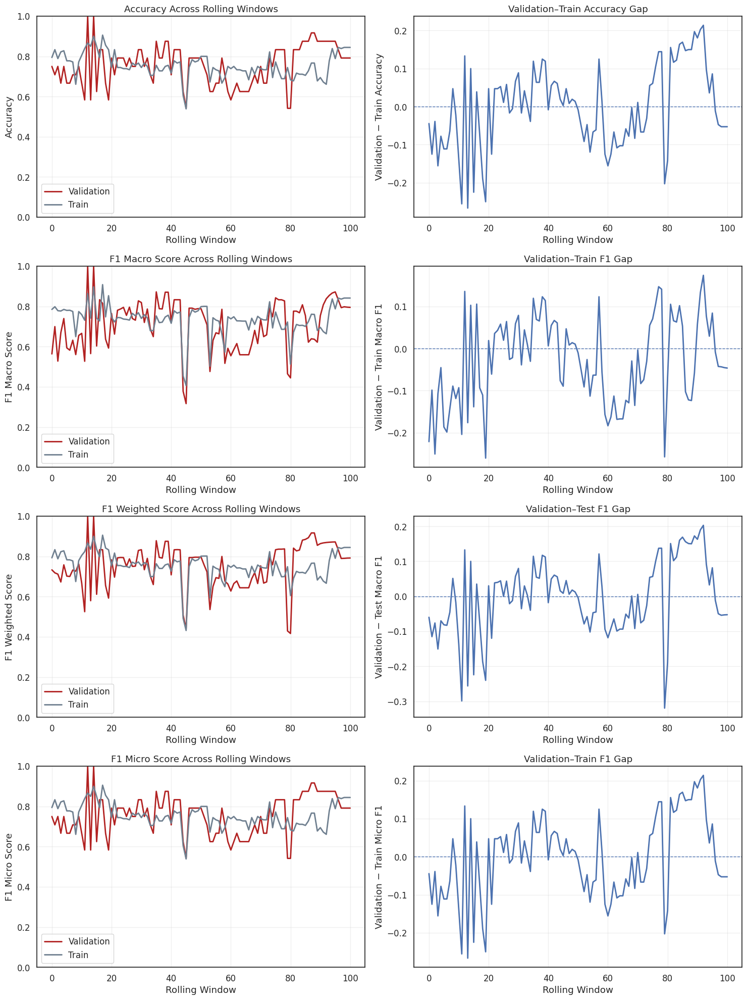


VARIABLES CONNECTED TO NEXT-MONTH OIL REGIME


,variable,count,percentage
1,cl_f,101,505.0
2,us_inds,7,35.0
0,Temp_mean_anom,2,10.0
3,A24STI,1,5.0
4,india_inds,1,5.0
5,nasdaq,1,5.0


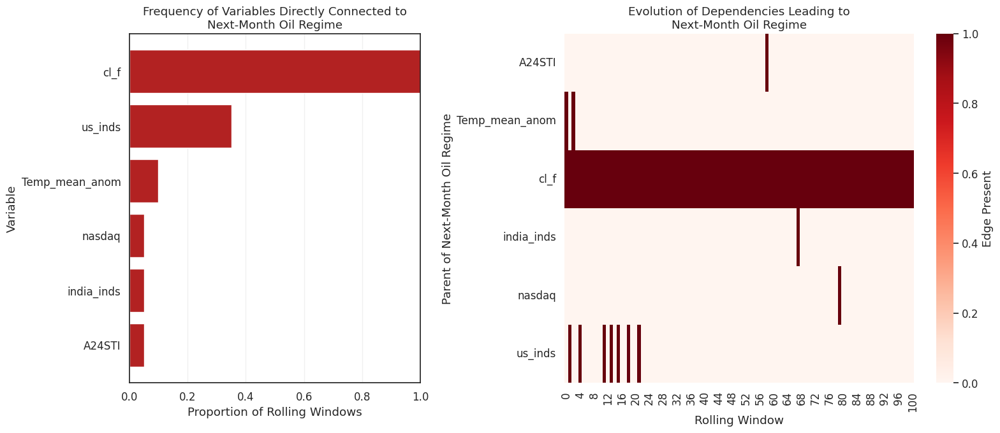

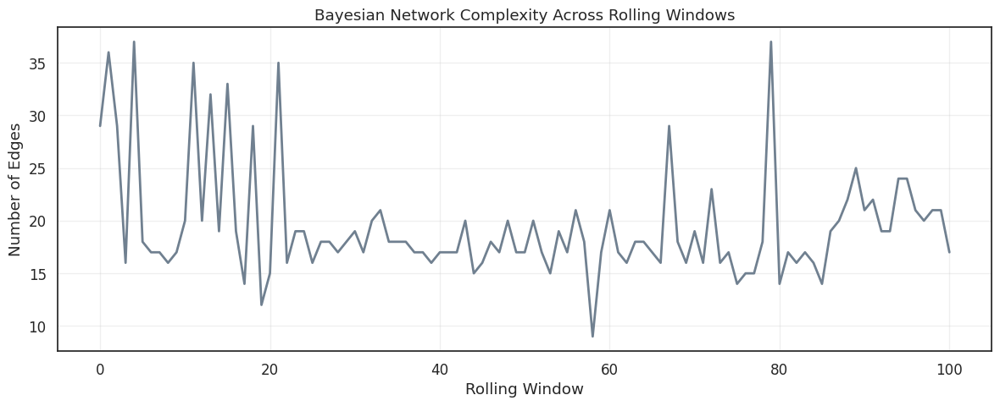


Network complexity:
Mean number of edges: 19.47
Std. deviation:       5.35
Minimum:               9
Maximum:               37


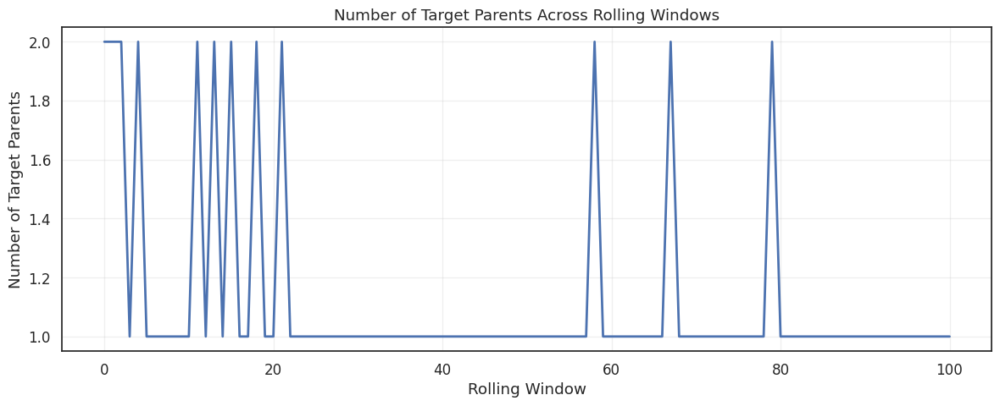

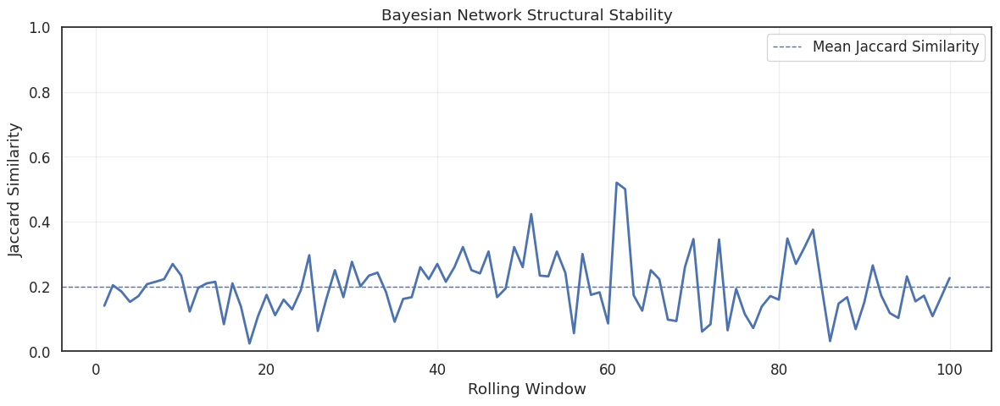


Mean structural similarity: 0.198

MODEL SELECTION FREQUENCY


,Number of Windows,Percentage
HC_BIC,89,88.12
HC_BDeu,11,10.89
PC,1,0.99


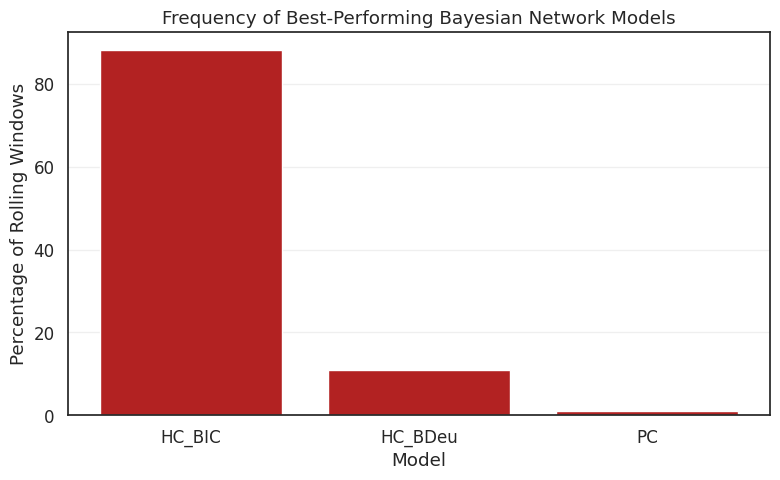


ROLLING WINDOW 0
Best model: HC_BDeu
Number of edges: 29

Edges:
  Temp_mean_anom → target
  oecd_inds → us_inds
  oecd_inds → russia_inds
  us_inds → CAPUTLG211S
  us_inds → geo_risk
  us_inds → world_inv
  russia_inds → world_inv
  russia_inds → oecd_consump
  world_inv → oecd_consump
  world_inv → india_inds
  world_inv → china_inds
  oecd_consump → A24STI
  oecd_consump → india_inds
  CAPUTLG211S → IPG21112S
  india_inds → IPG21112S
  india_inds → china_inds
  china_inds → geo_risk
  china_inds → nonoecd_consump
  opec_product → Temp_mean_anom
  A24STI → india_inds
  A24STI → CAPUTLG211S
  vix → nasdaq
  vix → dgs10
  nasdaq → opec_product
  nasdaq → A24STI
  nasdaq → us_inds
  dgs10 → cl_f
  cl_f → target
  cl_f → oecd_inds


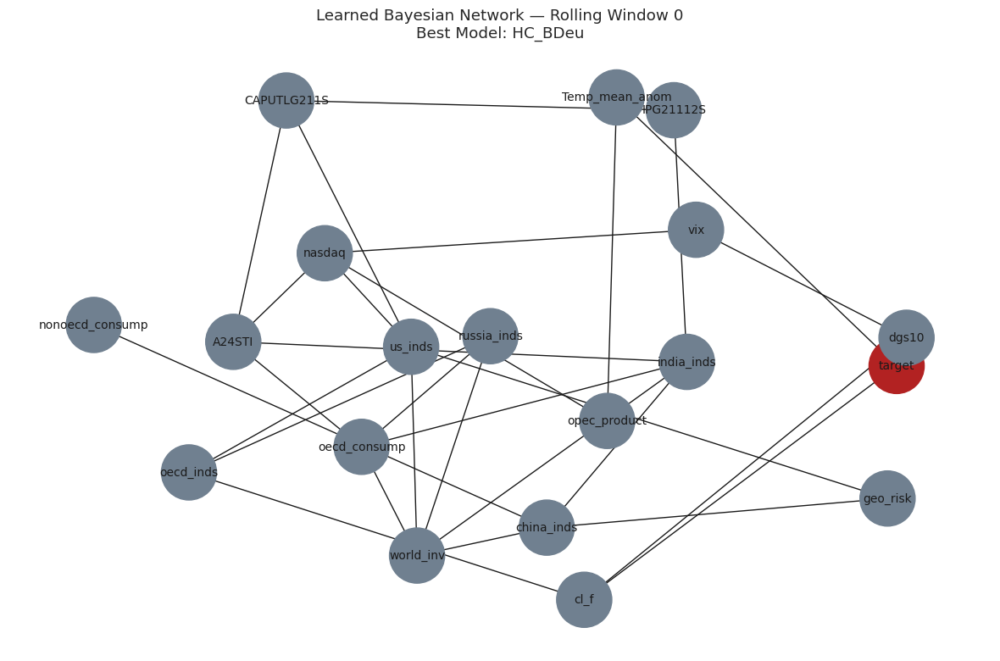

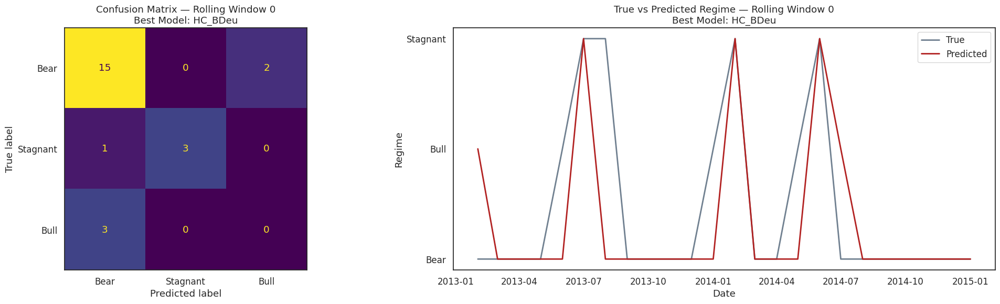

In [ ]:
import networkx as nx
from collections import Counter
from sklearn.metrics import (confusion_matrix, ConfusionMatrixDisplay)

# 1. RESULTS DATAFRAME
results_base_df = pd.DataFrame(results_baseline).set_index("window")
print("=" * 80)
print("BASELINE MODEL — ROLLING-WINDOW RESULTS")
print("=" * 80)
display(results_base_df[["train_accuracy","validation_accuracy",
                    "train_f1_macro","train_f1_weighted", "train_f1_micro",
                    "val_f1_macro","val_f1_weighted","val_f1_micro",]].round(3).head())

# 2. SUMMARY STATISTICS
metric_cols = ["train_accuracy","validation_accuracy",
                    "train_f1_macro","train_f1_weighted", "train_f1_micro",
                    "val_f1_macro","val_f1_weighted","val_f1_micro",]

summary = pd.DataFrame({"Mean": results_base_df[metric_cols].mean(),"Std. Dev.": results_base_df[metric_cols].std(),
                        "Minimum": results_base_df[metric_cols].min(),"Maximum": results_base_df[metric_cols].max()})
print("\n" + "=" * 80)
print("BASELINE MODEL — PERFORMANCE SUMMARY")
print("=" * 80)
display(summary.round(3))

# VALIDATION-Train PERFORMANCE GAP
results_base_df["accuracy_gap"] = (results_base_df["validation_accuracy"]- results_base_df["train_accuracy"])
results_base_df["f1_micro_gap"] = (results_base_df["val_f1_micro"]- results_base_df["train_f1_micro"])
results_base_df["f1_macro_gap"] = (results_base_df["val_f1_macro"]- results_base_df["train_f1_macro"])
results_base_df["f1_weighted_gap"] = (results_base_df["val_f1_weighted"]- results_base_df["train_f1_weighted"])

#  VALIDATION VS TEST PERFORMANCE OVER TIME
fig, ax = plt.subplots(4, 2, figsize=(15, 20))

# Accuracy
ax[0,0].plot(results_base_df.index,results_base_df["validation_accuracy"],label="Validation",linewidth=2, color = "firebrick")
ax[0,0].plot(results_base_df.index,results_base_df["train_accuracy"],label="Train",linewidth=2, color = "slategrey")
ax[0,0].set_xlabel("Rolling Window")
ax[0,0].set_ylabel("Accuracy")
ax[0,0].set_title("Accuracy Across Rolling Windows")
ax[0,0].set_ylim(0, 1)
ax[0,0].legend()
ax[0,0].grid(alpha=0.3)

ax[0,1].plot(results_base_df.index,results_base_df["accuracy_gap"],linewidth=2)
ax[0,1].axhline(0, linestyle="--", linewidth=1)
ax[0,1].set_xlabel("Rolling Window")
ax[0,1].set_ylabel("Validation − Train Accuracy")
ax[0,1].set_title("Validation–Train Accuracy Gap")
ax[0,1].grid(alpha=0.3)

# F1_macro
ax[1,0].plot(results_base_df.index,results_base_df["val_f1_macro"],label="Validation",linewidth=2,color = "firebrick")
ax[1,0].plot(results_base_df.index,results_base_df["train_f1_macro"],label="Train",linewidth=2, color = "slategrey")
ax[1,0].set_xlabel("Rolling Window")
ax[1,0].set_ylabel("F1 Macro Score")
ax[1,0].set_title("F1 Macro Score Across Rolling Windows")
ax[1,0].set_ylim(0, 1)
ax[1,0].legend()
ax[1,0].grid(alpha=0.3)

ax[1,1].plot(results_base_df.index,results_base_df["f1_macro_gap"],linewidth=2)
ax[1,1].axhline(0, linestyle="--", linewidth=1)
ax[1,1].set_xlabel("Rolling Window")
ax[1,1].set_ylabel("Validation − Train Macro F1")
ax[1,1].set_title("Validation–Train F1 Gap")
ax[1,1].grid(alpha=0.3)

# F1_weighted
ax[2,0].plot(results_base_df.index,results_base_df["val_f1_weighted"],label="Validation",linewidth=2,color = "firebrick")
ax[2,0].plot(results_base_df.index,results_base_df["train_f1_weighted"],label="Train",linewidth=2, color = "slategrey")
ax[2,0].set_xlabel("Rolling Window")
ax[2,0].set_ylabel("F1 Weighted Score")
ax[2,0].set_title("F1 Weighted Score Across Rolling Windows")
ax[2,0].set_ylim(0, 1)
ax[2,0].legend()
ax[2,0].grid(alpha=0.3)

ax[2,1].plot(results_base_df.index,results_base_df["f1_weighted_gap"],linewidth=2)
ax[2,1].axhline(0, linestyle="--", linewidth=1)
ax[2,1].set_xlabel("Rolling Window")
ax[2,1].set_ylabel("Validation − Test Macro F1")
ax[2,1].set_title("Validation–Test F1 Gap")
ax[2,1].grid(alpha=0.3)

# F1_micror
ax[3,0].plot(results_base_df.index,results_base_df["val_f1_micro"],label="Validation",linewidth=2,color = "firebrick")
ax[3,0].plot(results_base_df.index,results_base_df["train_f1_micro"],label="Train",linewidth=2, color = "slategrey")
ax[3,0].set_xlabel("Rolling Window")
ax[3,0].set_ylabel("F1 Micro Score")
ax[3,0].set_title("F1 Micro Score Across Rolling Windows")
ax[3,0].set_ylim(0, 1)
ax[3,0].legend()
ax[3,0].grid(alpha=0.3)

ax[3,1].plot(results_base_df.index,results_base_df["f1_micro_gap"],linewidth=2)
ax[3,1].axhline(0, linestyle="--", linewidth=1)
ax[3,1].set_xlabel("Rolling Window")
ax[3,1].set_ylabel("Validation − Train Micro F1")
ax[3,1].set_title("Validation–Train F1 Gap")
ax[3,1].grid(alpha=0.3)

plt.tight_layout()
plt.show()


# 5. FREQUENCY OF VARIABLES CONNECTED TO THE TARGET
target_parent_counts = Counter()
for r in results_baseline:
    for parent in r["target_parents"]:
        target_parent_counts[parent] += 1
target_parent_frequency = pd.DataFrame(target_parent_counts.items(),columns=["variable", "count"])
target_parent_frequency["frequency"] = (target_parent_frequency["count"] / len(results))
target_parent_frequency["percentage"] = (target_parent_frequency["frequency"] * 100)
freq = target_parent_frequency.sort_values("frequency",ascending=True)

print("\n" + "=" * 80)
print("VARIABLES CONNECTED TO NEXT-MONTH OIL REGIME")
print("=" * 80)

display(freq[["variable", "count", "percentage"]].sort_values("percentage",ascending=False).round(2))


# 6. VARIABLE FREQUENCY + EVOLUTION HEATMAP
fig, ax = plt.subplots(1, 2, figsize=(16, 7), gridspec_kw={"width_ratios": [1, 1.5]})

# ---- Left: Frequency ----
ax[0].barh(freq["variable"],freq["frequency"] , color = 'firebrick')
ax[0].set_xlabel("Proportion of Rolling Windows")
ax[0].set_ylabel("Variable")
ax[0].set_title("Frequency of Variables Directly Connected to\n"
    "Next-Month Oil Regime")
ax[0].set_xlim(0, 1)
ax[0].grid(axis="x", alpha=0.3)

# ---- Right: Evolution ----
all_target_parents = sorted(set(parent for r in results_baseline for parent in r["target_parents"]))
target_edge_matrix = pd.DataFrame(0,index=range(len(results_baseline)),columns=all_target_parents)
for r in results_baseline:
    w = r["window"]
    for parent in r["target_parents"]:
        target_edge_matrix.loc[w, parent] = 1
sns.heatmap(target_edge_matrix.T,cmap="Reds",cbar_kws={"label": "Edge Present"},ax=ax[1])
ax[1].set_xlabel("Rolling Window")
ax[1].set_ylabel("Parent of Next-Month Oil Regime")
ax[1].set_title("Evolution of Dependencies Leading to\n"
    "Next-Month Oil Regime")

plt.tight_layout()
plt.show()


# 7. NUMBER OF EDGES — NETWORK COMPLEXITY
edge_counts = [len(r["edges"]) for r in results_baseline]
fig, ax = plt.subplots(figsize=(12, 5))
ax.plot(range(len(edge_counts)),edge_counts,linewidth=2, color = 'slategrey')
ax.set_xlabel("Rolling Window")
ax.set_ylabel("Number of Edges")
ax.set_title("Bayesian Network Complexity Across Rolling Windows")
ax.grid(alpha=0.3)
plt.tight_layout()
plt.show()


print("\nNetwork complexity:")
print(f"Mean number of edges: {np.mean(edge_counts):.2f}")
print(f"Std. deviation:       {np.std(edge_counts):.2f}")
print(f"Minimum:               {np.min(edge_counts)}")
print(f"Maximum:               {np.max(edge_counts)}")

# 7. NUMBER OF EDGES — NETWORK COMPLEXITY
edge_counts = [len(r["target_parents"]) for r in results_baseline]
fig, ax = plt.subplots(figsize=(12, 5))
ax.plot(range(len(edge_counts)),edge_counts,linewidth=2)
ax.set_xlabel("Rolling Window")
ax.set_ylabel("Number of Target Parents")
ax.set_title("Number of Target Parents Across Rolling Windows")
ax.grid(alpha=0.3)
plt.tight_layout()
plt.show()


# 8. GRAPH STRUCTURAL STABILITY
def edge_jaccard(edges1, edges2):
    e1 = set(edges1)
    e2 = set(edges2)
    if len(e1) == 0 and len(e2) == 0:
        return 1.0
    union = e1 | e2
    if len(union) == 0:
        return 1.0
    return len(e1 & e2) / len(union)

graph_stability = []
for i in range(1, len(results_baseline)):
    similarity = edge_jaccard(results_baseline[i - 1]["edges"],results_baseline[i]["edges"])
    graph_stability.append({"window": i,"jaccard_similarity": similarity})
graph_stability_df = pd.DataFrame(graph_stability)

fig, ax = plt.subplots(figsize=(12, 5))
ax.plot(graph_stability_df["window"],graph_stability_df["jaccard_similarity"],linewidth=2)
ax.axhline(graph_stability_df["jaccard_similarity"].mean(),linestyle="--", linewidth=1,label="Mean Jaccard Similarity")
ax.set_xlabel("Rolling Window")
ax.set_ylabel("Jaccard Similarity")
ax.set_title("Bayesian Network Structural Stability")

ax.set_ylim(0, 1)
ax.legend()
ax.grid(alpha=0.3)

plt.tight_layout()
plt.show()

print(f"\nMean structural similarity: "
    f"{graph_stability_df['jaccard_similarity'].mean():.3f}")


# 9. HOW OFTEN DOES EACH METHOD WIN?
model_frequency = (pd.Series([r["best_model"] for r in results_baseline]).value_counts())
model_frequency_pct = (model_frequency / len(results_baseline) * 100)
model_summary = pd.DataFrame({"Number of Windows": model_frequency,"Percentage": model_frequency_pct})
print("\n" + "=" * 80)
print("MODEL SELECTION FREQUENCY")
print("=" * 80)

display(model_summary.round(2))

fig, ax = plt.subplots(figsize=(8, 5))
ax.bar(model_summary.index,model_summary["Percentage"], color = 'firebrick')
ax.set_ylabel("Percentage of Rolling Windows")
ax.set_xlabel("Model")
ax.set_title("Frequency of Best-Performing Bayesian Network Models")
ax.grid(axis="y", alpha=0.3)
plt.tight_layout()
plt.show()


# 10. SELECTED NETWORK STRUCTURES

selected_windows = [w for w in [0, 20, 40, 60, 80, 100] if w < len(results)]

labels = ["Bear", "Stagnant", "Bull"]

for w in selected_windows:

    r = results_baseline[w]

    print("\n" + "=" * 80)
    print(f"ROLLING WINDOW {w}")
    print("=" * 80)

    print(f"Best model: {r['best_model']}")
    print(f"Number of edges: {len(r['edges'])}")

    print("\nEdges:")
    for edge in r["edges"]:
        print(f"  {edge[0]} → {edge[1]}")

    # 1. BAYESIAN NETWORK STRUCTURE
    G = nx.DiGraph()
    G.add_edges_from(r["edges"])

    # Make sure target is shown
    if "target" not in G:
        G.add_node("target")

    plt.figure(figsize=(12, 8))
    pos = nx.spring_layout(G,seed=42,k=1.2)

    node_colors = ["firebrick" if node == "target" else "slategrey" for node in G.nodes()]
    nx.draw_networkx_nodes(G,pos,node_size=2200,node_color=node_colors)
    nx.draw_networkx_edges(G,pos,arrows=True,arrowsize=25, arrowstyle="-|>")
    nx.draw_networkx_labels(G,pos,font_size=10)
    plt.title(f"Learned Bayesian Network — Rolling Window {w}\n"
        f"Best Model: {r['best_model']}")
    plt.axis("off")
    plt.tight_layout()
    plt.show()
    # 2. CONFUSION MATRIX
    cm = confusion_matrix(all_y_true[w],all_y_pred[w],labels=labels)
    fig, ax = plt.subplots(1,2,figsize=(21, 6))
    disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=labels)
    disp.plot(ax=ax[0],values_format="d",colorbar=False)
    ax[0].set_title(f"Confusion Matrix — Rolling Window {w}\n"
        f"Best Model: {r['best_model']}")

    # 3. TRUE VS PREDICTED REGIME
    # Use the actual dates corresponding to the predictions.
    test_dates = valid_data_cat[w].index[:len(all_y_true[w])]
    ax[1].plot(test_dates,all_y_true[w],label="True",linewidth=2, color = 'slategrey')
    ax[1].plot(test_dates,all_y_pred[w],label="Predicted",linewidth=2, color = 'firebrick')
    ax[1].set_title(f"True vs Predicted Regime — Rolling Window {w}\n"
        f"Best Model: {r['best_model']}")
    plt.xlabel("Date")
    plt.ylabel("Regime")
    plt.legend()
    plt.tight_layout()
    plt.show()